# Timing of RSBW and ALBW pathways 

This notebook calculates how long it takes for the tracer to get to each grid cell. 

In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'

import cosima_cookbook as cc
from cosima_cookbook import explore

import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import gridspec
import matplotlib.path as mpath
from matplotlib import ticker, cm
import numpy as np
import netCDF4 as nc
import xarray as xr
import cmocean.cm as cmocean
import glob,os
import climtas.nci
import matplotlib.colors as mcolors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import pickle
import datetime
import xgcm
import cmcrameri


import cartopy.crs as ccrs
import cartopy.feature as cfeature

import sys
sys.path.append("/g/data/x77/ps7863/python_scripts")
import helper_functions as helper

import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

In [4]:
save_dir = '/g/data/x77/ps7863/data/AABW_variability'



In [5]:
climtas.nci.GadiClient()

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/42897/status,
Dashboard: /proxy/42897/status,Workers: 12
Total threads: 12,Total memory: 46.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:37313,Workers: 12
Dashboard: /proxy/42897/status,Total threads: 12
Started: Just now,Total memory: 46.00 GiB
Comm: tcp://127.0.0.1:41283,Total threads: 1
Dashboard: /proxy/38595/status,Memory: 3.83 GiB
Nanny: tcp://127.0.0.1:37881,


In [6]:
session = cc.database.create_session('/g/data/ik11/databases/cosima_master.db')
iaf_cycle3 = '01deg_jra55v140_iaf_cycle3'
expt = '01deg_jra55v140_iaf_cycle3_antarctic_tracers'
figdir = '/g/data/x77/ps7863/figures/AABW_variability/'

In [7]:
first_year = '1958'
last_year = '2018'
start_time=first_year+'-01-01'
end_time=last_year+'-12-31'
time_slice = slice(start_time, end_time)

lon_slice = slice(80-360, 190-360)
lat_slice = slice(-82, -55)

In [8]:
ht = cc.querying.getvar(iaf_cycle3,'ht',session, n=1) 
ht = ht.sel(yt_ocean = lat_slice).sel(xt_ocean=lon_slice)
land_mask = np.squeeze(ht.values)
land_mask = land_mask * 0
land_mask[np.isnan(land_mask)] = 1
yt_ocean =ht.yt_ocean.values
xt_ocean =ht.xt_ocean.values
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)

In [9]:
shelf_mask = ht > 1000
shelf_mask = shelf_mask.astype(bool)
masked_shelf = shelf_mask.where(shelf_mask==0, np.nan)
shelf_mask = shelf_mask.where(shelf_mask==1, np.nan)

Load monthly tracer concentration data

In [10]:
tr_adelie = cc.querying.getvar(iaf_cycle3, 'passive_adelie', session,
                               frequency='1 monthly',
                               attrs={'cell_methods': 'time: mean'},
                               start_time=start_time, end_time=end_time,
                               chunks={'time':12, 'xt_ocean':100, 'yt_ocean':100})

tr_adelie = tr_adelie.sel(time=slice(start_time, end_time)).sel(yt_ocean=lat_slice).sel(xt_ocean=lon_slice)

/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xarray/core/dataset.py:274: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 100. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xarray/core/dataset.py:274: UserWarning: The specified chunks separate the stored chunks along dimension "xt_ocean" starting at index 100. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3-24.04/lib/python3.10/site-packages/xarray/core/dataset.py:274: UserWarning: The specified chunks separate the stored chunks along dimension "yt_ocean" starting at index 100. This could degrade performance. Instead, consider rechunking after loading.
  warnings.warn(
/g/data/hh5/public/apps/miniconda3/envs/analysis3

In [ ]:
tr_ross = cc.querying.getvar(iaf_cycle3, 'passive_ross',
                            session,
                             frequency='1 monthly',
                             attrs={'cell_methods': 'time: mean'},
                             start_time=start_time, end_time=end_time,
                             chunks={'time':12, 'xt_ocean':100, 'yt_ocean':100})

tr_ross = tr_ross.sel(time=slice(start_time, end_time)).sel(yt_ocean=lat_slice).sel(xt_ocean=lon_slice)

In [40]:
bottom_adelie = xr.open_dataset(f'{save_dir}/bottom_ALBW_tracer.nc')
bottom_ross = xr.open_dataset(f'{save_dir}/bottom_RSBW_tracer.nc')
bottom_adelie = bottom_adelie['Bottom ALBW tracer']
bottom_ross = bottom_ross['Bottom RSBW tracer']

In [121]:
bot_mask = tr_adelie.where(~np.isfinite(tr_adelie.shift({'st_ocean': -1})))
bot_mask = ~np.isnan(bot_mask)
bot_mask

<xarray.DataArray 'passive_adelie' (time: 36, st_ocean: 75, yt_ocean: 584,
                                    xt_ocean: 1100)> Size: 2GB
dask.array<invert, shape=(36, 75, 584, 1100), dtype=bool, chunksize=(3, 19, 100, 100), chunktype=numpy.ndarray>
Coordinates:
  * xt_ocean  (xt_ocean) float64 9kB -279.9 -279.8 -279.7 ... -170.1 -170.0
  * yt_ocean  (yt_ocean) float64 5kB -81.11 -81.07 -81.02 ... -55.07 -55.01
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03
  * time      (time) datetime64[ns] 288B 1958-01-16T12:00:00 ... 1960-12-16T1...
Attributes:
    long_name:      passive (adelie)
    units:          dimensionless
    valid_range:    [-10. 100.]
    cell_methods:   time: mean
    time_avg_info:  average_T1,average_T2,average_DT
    ncfiles:        ['/g/data/ik11/outputs/access-om2-01/01deg_jra55v140_iaf_...
    contact:        Andrew Kiss
    email:          andrew.kiss@anu.edu.au
    created:        2020-11-11
    description:    0.1 degree ACCESS-OM2 global model configuration under in...
    notes:          Run configuration and history: https://github.com/COSIMA/...

In [11]:
albw = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/ALBW_tracer_bottom_500_1958-2018.nc')
rsbw = xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/RSBW_tracer_bottom_500_1958-2018.nc')
albw = albw['ALBW_tracer']
rsbw = rsbw['RSBW tracer']

In [12]:
rsbw

<xarray.DataArray 'RSBW tracer' (time: 732, yt_ocean: 584, xt_ocean: 1100)> Size: 2GB
array([[[     nan,      nan, ...,      nan,      nan],
        [     nan,      nan, ...,      nan,      nan],
        ...,
        [0.      , 0.      , ..., 0.      , 0.      ],
        [0.      , 0.      , ..., 0.      , 0.      ]],

       [[     nan,      nan, ...,      nan,      nan],
        [     nan,      nan, ...,      nan,      nan],
        ...,
        [0.      , 0.      , ..., 0.      , 0.      ],
        [0.      , 0.      , ..., 0.      , 0.      ]],

       ...,

       [[     nan,      nan, ...,      nan,      nan],
        [     nan,      nan, ...,      nan,      nan],
        ...,
        [0.051637, 0.058177, ..., 0.056583, 0.056217],
        [0.057978, 0.059771, ..., 0.056453, 0.056427]],

       [[     nan,      nan, ...,      nan,      nan],
        [     nan,      nan, ...,      nan,      nan],
        ...,
        [0.053159, 0.057838, ..., 0.057255, 0.057013],
        [0.057135, 0.058193, ..., 0.05708 , 0.057176]]], dtype=float32)
Coordinates:
  * xt_ocean  (xt_ocean) float64 9kB -279.9 -279.8 -279.7 ... -170.1 -170.0
  * yt_ocean  (yt_ocean) float64 5kB -81.11 -81.07 -81.02 ... -55.07 -55.01
  * time      (time) datetime64[ns] 6kB 1958-01-16T12:00:00 ... 2018-12-16T12...

In [12]:
mask_nan = np.isnan(rsbw[0,...])
rsbw_masked = rsbw.where(~mask_nan,0)
mask_nan = np.isnan(albw[0,...])
albw_masked = albw.where(~mask_nan,0)

In [10]:
rsbw_clim = rsbw_masked.groupby('time.month').mean('time')
albw_clim = albw_masked.groupby('time.month').mean('time')

albw_range = albw_clim.max('month') - albw_clim.min('month')
rsbw_range = rsbw_clim.max('month') - rsbw_clim.min('month')

INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'numpy'
INFO:flox:Entering _validate_reindex: reindex is None
INFO:flox:Leaving _validate_reindex: method = None, returning None
INFO:flox:_choose_engine: Choosing 'numpy'


### Finding threshold on rolling mean

In [11]:
# rsbw_mean = helper.annual_mean_from_monthly(rsbw_masked)
rsbw_rolling_mean = rsbw_masked.rolling(time=12, center=True, min_periods=1).mean('time')
rsbw_mean = helper.annual_mean_from_monthly(rsbw_rolling_mean)
condition = rsbw_rolling_mean >= (rsbw_mean * 0.15)
rsbw_threshold = rsbw_rolling_mean.where(condition) #, drop=True)


# albw_mean = helper.annual_mean_from_monthly(albw_masked)
albw_rolling_mean = albw_masked.rolling(time=12, center=True, min_periods=1).mean('time')
albw_mean = helper.annual_mean_from_monthly(albw_rolling_mean)
condition = albw_rolling_mean >= (albw_mean * 0.15)
albw_threshold = albw_rolling_mean.where(condition) #, drop=True)

In [12]:
# rsbw_time_indices = rsbw_threshold.argmin(dim='time')
rsbw_time_indices = np.where(~np.isnan(rsbw_threshold))[0][0]
rsbw_timing = rsbw_rolling_mean.isel(time=rsbw_time_indices).time.dt.date

# albw_time_indices = albw_threshold.argmin(dim='time')
albw_time_indices = np.where(~np.isnan(albw_threshold))[0][0]
albw_timing = albw_rolling_mean.isel(time=albw_time_indices).time.dt.date

In [13]:
rsbw_time_indices = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    rsbw_threshold,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
rsbw_timing = rsbw_rolling_mean.isel(time=rsbw_time_indices).time.dt.date



albw_time_indices = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    albw_threshold,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
albw_timing = albw_rolling_mean.isel(time=albw_time_indices).time.dt.date


In [14]:
start_time = datetime.date(1958, 1, 16)
rsbw_timedelta = ((rsbw_timing - start_time).dt.days / 365) # in years
albw_timedelta = ((albw_timing - start_time).dt.days / 365) # in years

rsbw_timedelta_mon = ((rsbw_timing - start_time).dt.days/30) # in months
albw_timedelta_mon = ((albw_timing - start_time).dt.days/30) # in months

## Spherical maps

In [15]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [16]:
land_50m = cfeature.NaturalEarthFeature(
    "physical", "land", "50m", edgecolor="black", facecolor="grey", linewidth=0.5
)

In [17]:
xt_ocean = ht.xt_ocean
yt_ocean = ht.yt_ocean

In [18]:
X, Y = np.meshgrid(xt_ocean, yt_ocean)
X = xr.DataArray(X, coords=[yt_ocean, xt_ocean], dims=['yt_ocean', 'xt_ocean'])
Y = xr.DataArray(Y, coords=[yt_ocean, xt_ocean], dims=['yt_ocean', 'xt_ocean'])

In [19]:
def make_boundary_path(longitudes, latitudes):
    """
    Return a path around boundary to create a sector map, then cut it out given
    longitudes and latitudes.
    """

    boundary_path = np.array([longitudes[-1, :], latitudes[-1, :]])
    boundary_path = np.append(
        boundary_path, np.array([longitudes[::-1, -1], latitudes[::-1, -1]]), axis=1
    )
    boundary_path = np.append(
        boundary_path, np.array([longitudes[1, ::-1], latitudes[1, ::-1]]), axis=1
    )
    boundary_path = np.append(
        boundary_path, np.array([longitudes[:, 1], latitudes[:, 1]]), axis=1
    )
    boundary_path = mpath.Path(np.swapaxes(boundary_path, 0, 1))

    return boundary_path

In [20]:
# To plot 1000-m contour
contour_file = np.load('/g/data/ik11/grids/Antarctic_slope_contour_1000m.npz')
shelf = contour_file['contour_masked_above']
yt_ocean = contour_file['yt_ocean']
xt_ocean = contour_file['xt_ocean']
# Mask values that are non-zero
shelf[np.where(shelf!=0)] = np.nan
shelf = shelf+1
shelf = np.nan_to_num(shelf)
shelf = xr.DataArray(shelf, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])

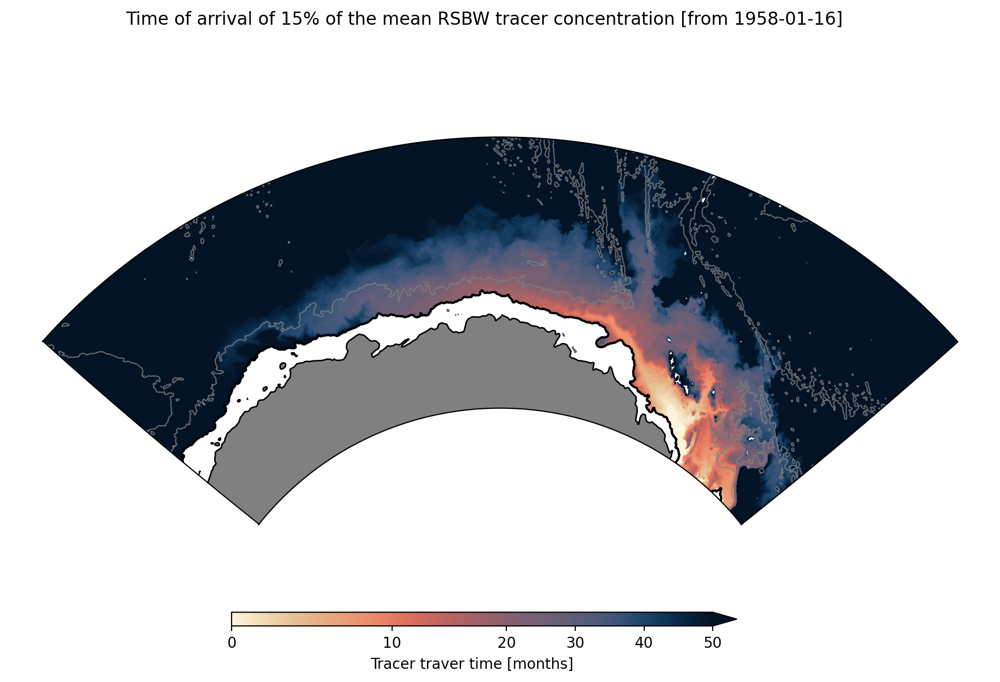

In [24]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=15, vmax=50)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, rsbw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max')
cbar.set_label(f'Tracer traver time [months]')

plt.suptitle('Time of arrival of 15% of the mean RSBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/rsbw_timing_map_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


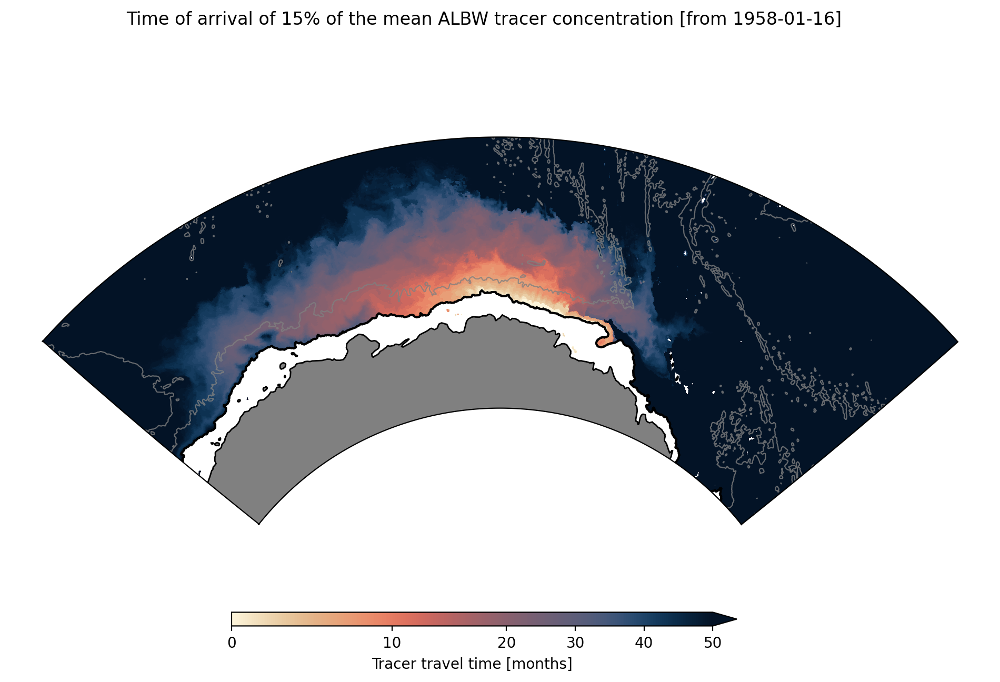

In [25]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=15, vmax=50)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max')
cbar.set_label(f'Tracer travel time [months]')

plt.suptitle('Time of arrival of 15% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


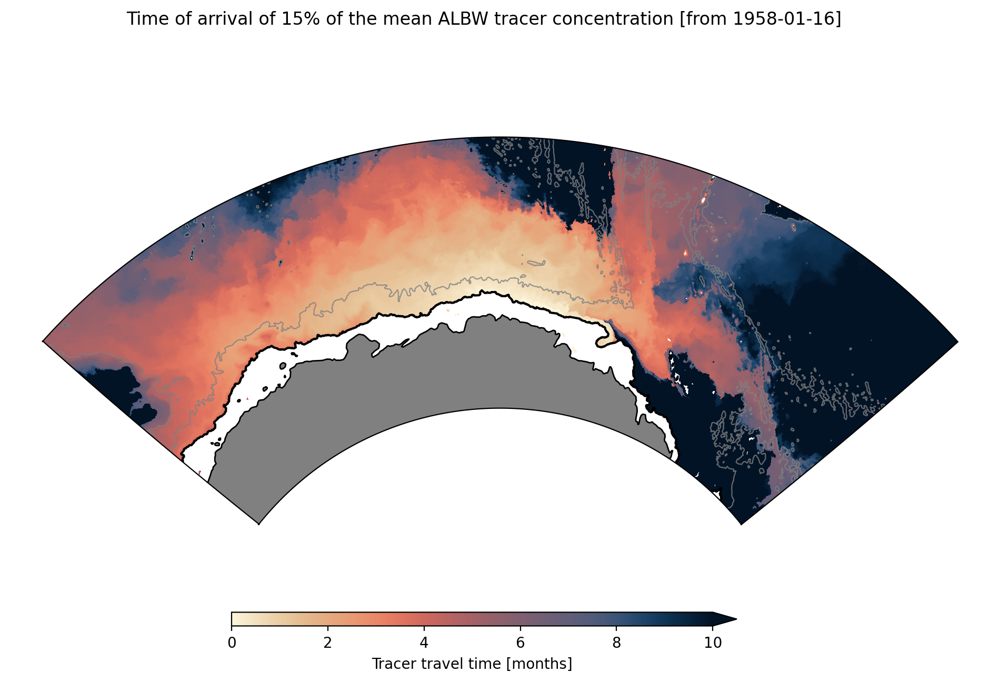

In [26]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=5, vmax=10)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max')
cbar.set_label(f'Tracer travel time [months]')

plt.suptitle('Time of arrival of 15% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_yrs_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


### Finding threshold on original time-series 

In [13]:
rsbw_mean = helper.annual_mean_from_monthly(rsbw_masked)
condition = rsbw_masked >= (rsbw_mean * 0.15)
rsbw_threshold_15 = rsbw_masked.where(condition) #, drop=True)


albw_mean = helper.annual_mean_from_monthly(albw_masked)
condition = albw_masked >= (albw_mean * 0.15)
albw_threshold_15 = albw_masked.where(condition) #, drop=True)

In [170]:
rsbw_time_indices_15 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    rsbw_threshold_15,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
rsbw_timing_15 = rsbw_masked.isel(time=rsbw_time_indices_15).time.dt.date



albw_time_indices_15 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    albw_threshold_15,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
albw_timing_15 = albw_masked.isel(time=albw_time_indices_15).time.dt.date


In [171]:
start_time = datetime.date(1958, 1, 16)
rsbw_timedelta = ((rsbw_timing_15 - start_time).dt.days / 365) # in years
albw_timedelta = ((albw_timing_15 - start_time).dt.days / 365) # in years

rsbw_timedelta_mon = ((rsbw_timing_15 - start_time).dt.days/30) # in months
albw_timedelta_mon = ((albw_timing_15 - start_time).dt.days/30) # in months

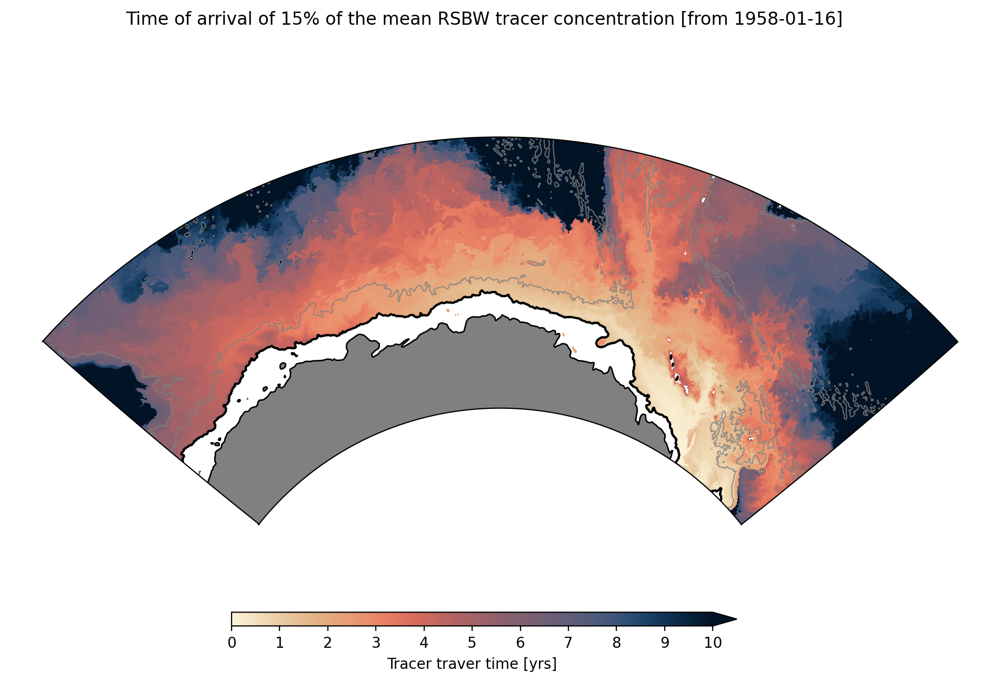

In [172]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, rsbw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer traver time [yrs]')

plt.suptitle('Time of arrival of 15% of the mean RSBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/rsbw_timing_map_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


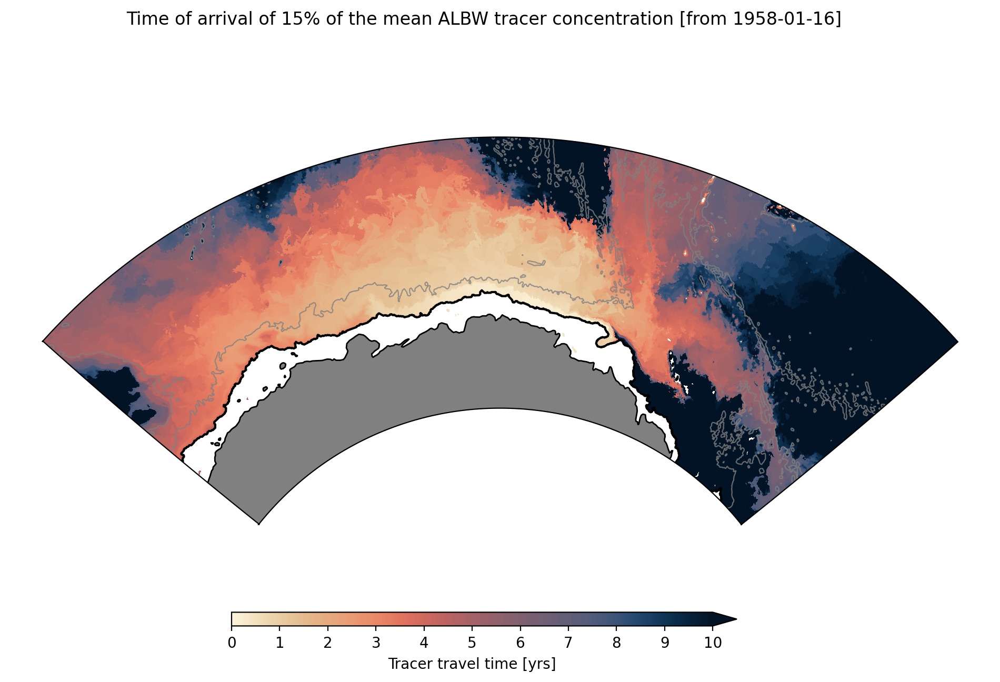

In [173]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 15% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


### In years

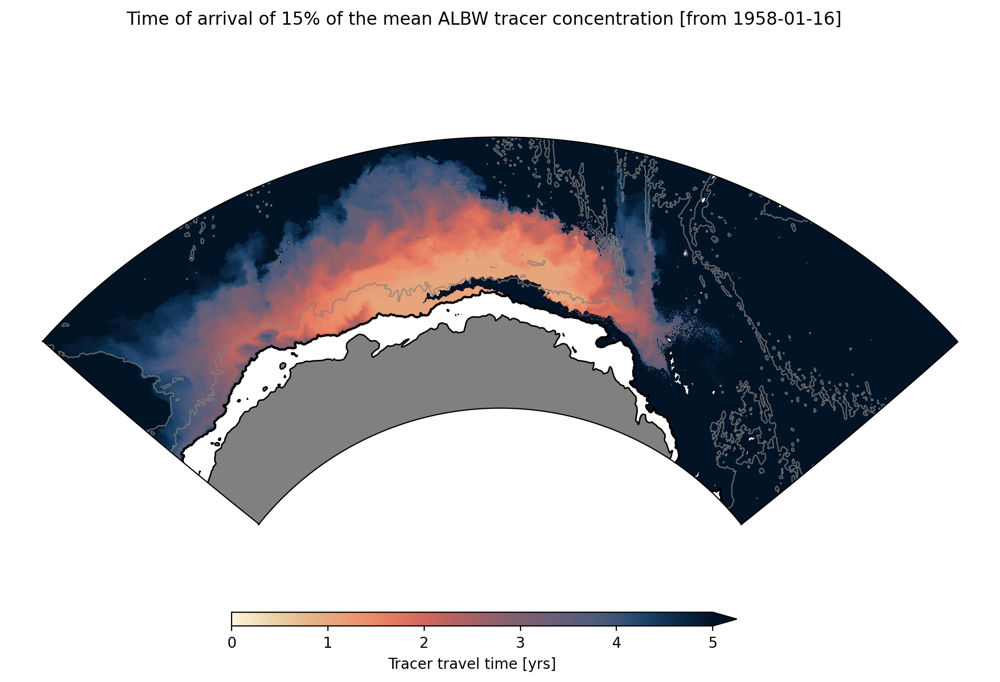

In [48]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=2.5, vmax=5)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max')
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 15% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_in_yrs_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


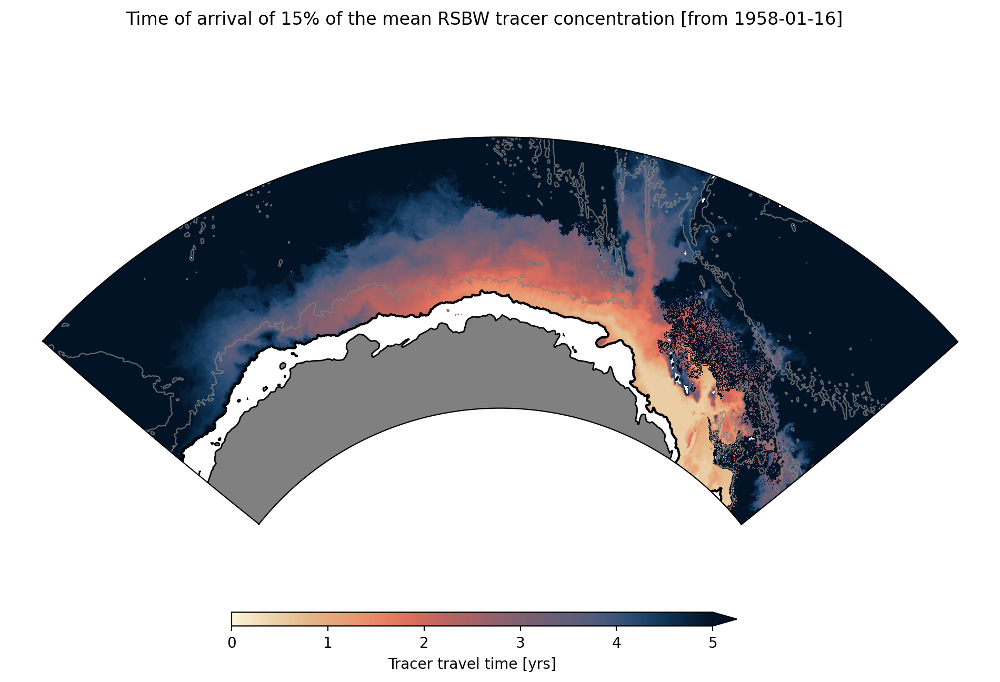

In [49]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=2.5, vmax=5)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, rsbw_timedelta*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max')
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 15% of the mean RSBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/rsbw_timing_map_in_yrs_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


## Threshold: 10% of the mean

In [174]:
condition = rsbw_masked >= (rsbw_mean * 0.10)
rsbw_threshold_10 = rsbw_masked.where(condition) #, drop=True)

condition = albw_masked >= (albw_mean * 0.10)
albw_threshold_10 = albw_masked.where(condition) #, drop=True)

In [175]:
rsbw_time_indices_10 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    rsbw_threshold_10,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
rsbw_timing_10 = rsbw_masked.isel(time=rsbw_time_indices_10).time.dt.date



albw_time_indices_10 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    albw_threshold_10,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
albw_timing_10 = albw_masked.isel(time=albw_time_indices_10).time.dt.date


In [176]:
start_time = datetime.date(1958, 1, 16)
rsbw_timedelta = ((rsbw_timing_10 - start_time).dt.days / 365) # in years
albw_timedelta = ((albw_timing_10 - start_time).dt.days / 365) # in years

rsbw_timedelta_mon = ((rsbw_timing_10 - start_time).dt.days/30) # in months
albw_timedelta_mon = ((albw_timing_10 - start_time).dt.days/30) # in months

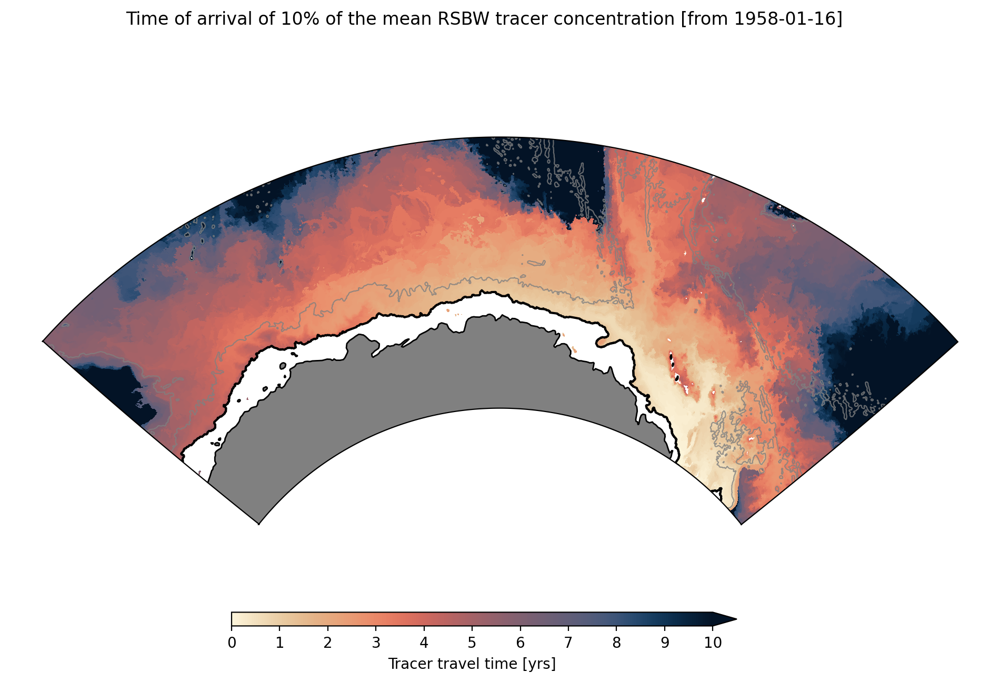

In [177]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, rsbw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 10% of the mean RSBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/rsbw_timing_map_10%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


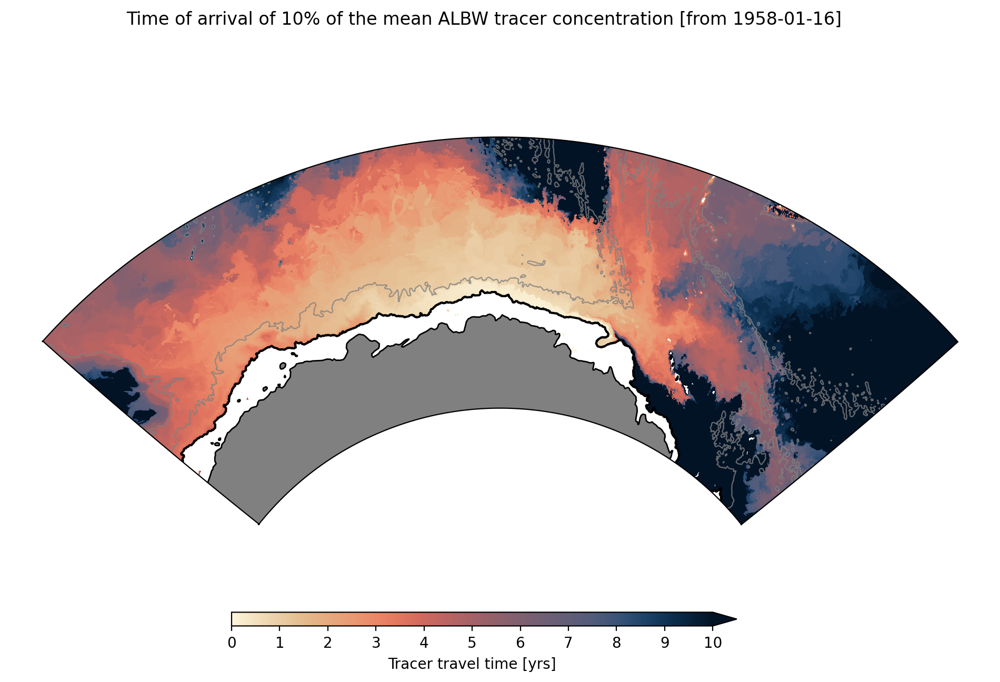

In [178]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 10% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_10%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


## Threshold: 30% of the mean

In [14]:
condition = rsbw_masked >= (rsbw_mean * 0.30)
rsbw_threshold_30 = rsbw_masked.where(condition, drop=True)

condition = albw_masked >= (albw_mean * 0.30)
albw_threshold_30 = albw_masked.where(condition, drop=True)

In [15]:
rsbw_time_indices_30 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    rsbw_threshold_30,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
rsbw_timing_30 = rsbw_masked.isel(time=rsbw_time_indices_30).time.dt.date



albw_time_indices_30 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    albw_threshold_30,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
albw_timing_30 = albw_masked.isel(time=albw_time_indices_30).time.dt.date


In [16]:
start_time = datetime.date(1958, 1, 16)
rsbw_timedelta = ((rsbw_timing_30 - start_time).dt.days / 365) # in years
albw_timedelta = ((albw_timing_30 - start_time).dt.days / 365) # in years

rsbw_timedelta_mon = ((rsbw_timing_30 - start_time).dt.days/30) # in months
albw_timedelta_mon = ((albw_timing_30 - start_time).dt.days/30) # in months

In [18]:
save_dir = '/g/data/x77/ps7863/data/AABW_variability/'

rsbw_timedelta.to_dataset(name='RSBW travel time').assign_attrs(Description='Time it takes for the tracer to reach 30% of its local mean concentration', unit='yrs').to_netcdf(f'{save_dir}RSBW_30%_travel_time_yrs_{first_year}-{last_year}.nc')
albw_timedelta.to_dataset(name='ALBW travel time').assign_attrs(Description='Time it takes for the tracer to reach 30% of its local mean concentration', unit='yrs').to_netcdf(f'{save_dir}ALBW_30%_travel_time_yrs_{first_year}-{last_year}.nc')

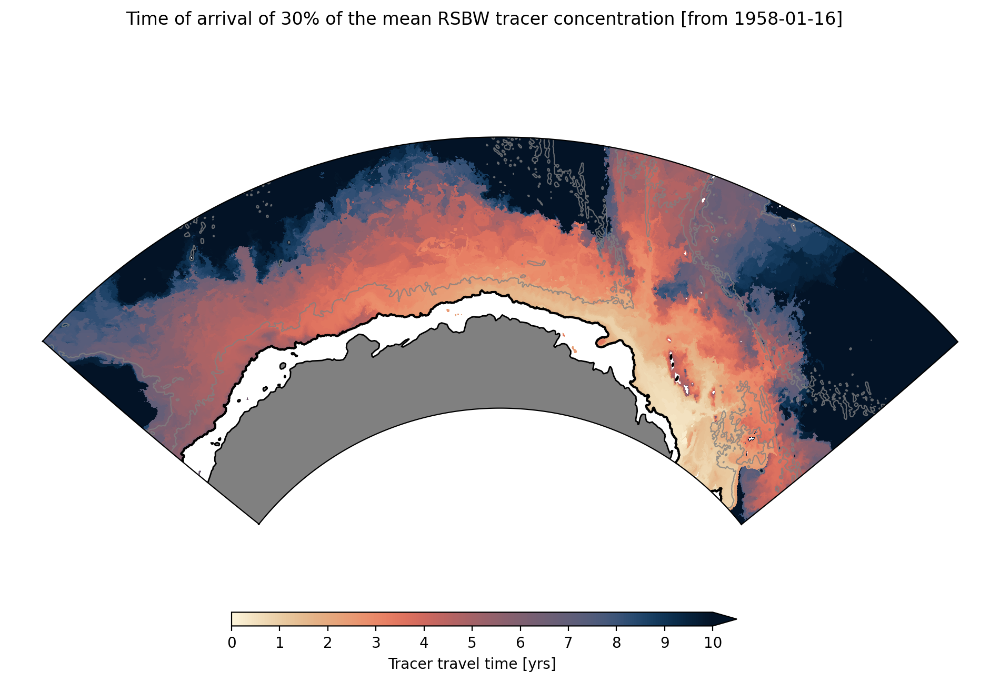

In [182]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, rsbw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max',ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 30% of the mean RSBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/rsbw_timing_map_30%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


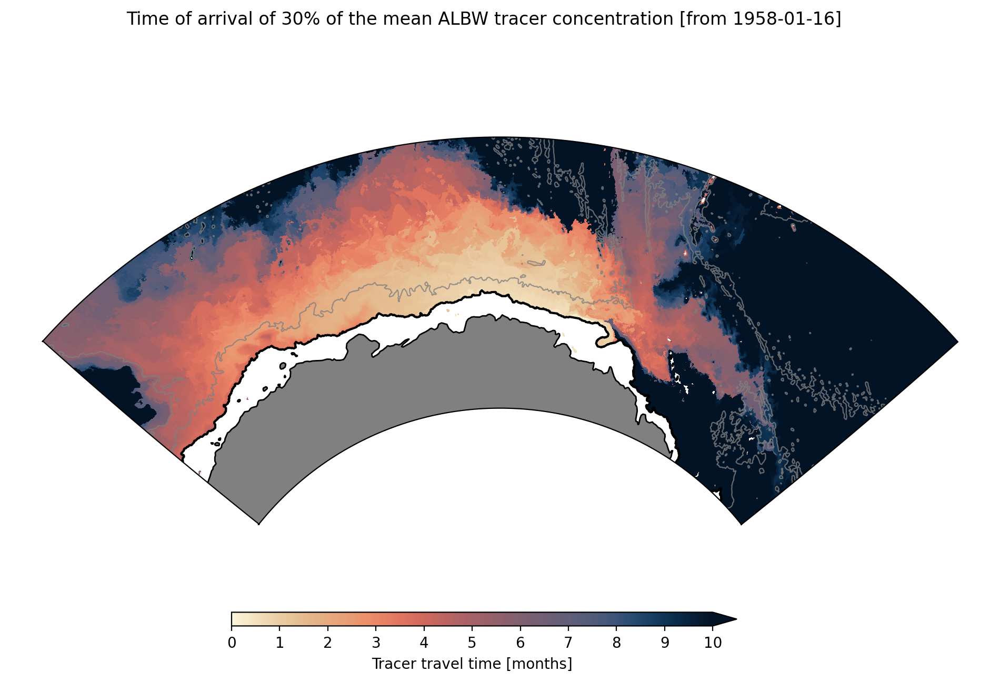

In [183]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [months]')

plt.suptitle('Time of arrival of 30% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_30%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


## Threshold: 50% of the mean

In [184]:
condition = rsbw_masked >= (rsbw_mean * 0.50)
rsbw_threshold_50 = rsbw_masked.where(condition, drop=True)

condition = albw_masked >= (albw_mean * 0.50)
albw_threshold_50 = albw_masked.where(condition, drop=True)

In [185]:
rsbw_time_indices_50 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    rsbw_threshold_50,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
rsbw_timing_50 = rsbw_masked.isel(time=rsbw_time_indices_50).time.dt.date



albw_time_indices_50 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    albw_threshold_50,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
albw_timing_50 = albw_masked.isel(time=albw_time_indices_50).time.dt.date


In [186]:
start_time = datetime.date(1958, 1, 16)
rsbw_timedelta = ((rsbw_timing_50 - start_time).dt.days / 365) # in years
albw_timedelta = ((albw_timing_50 - start_time).dt.days / 365) # in years

rsbw_timedelta_mon = ((rsbw_timing_50 - start_time).dt.days/30) # in months
albw_timedelta_mon = ((albw_timing_50 - start_time).dt.days/30) # in months

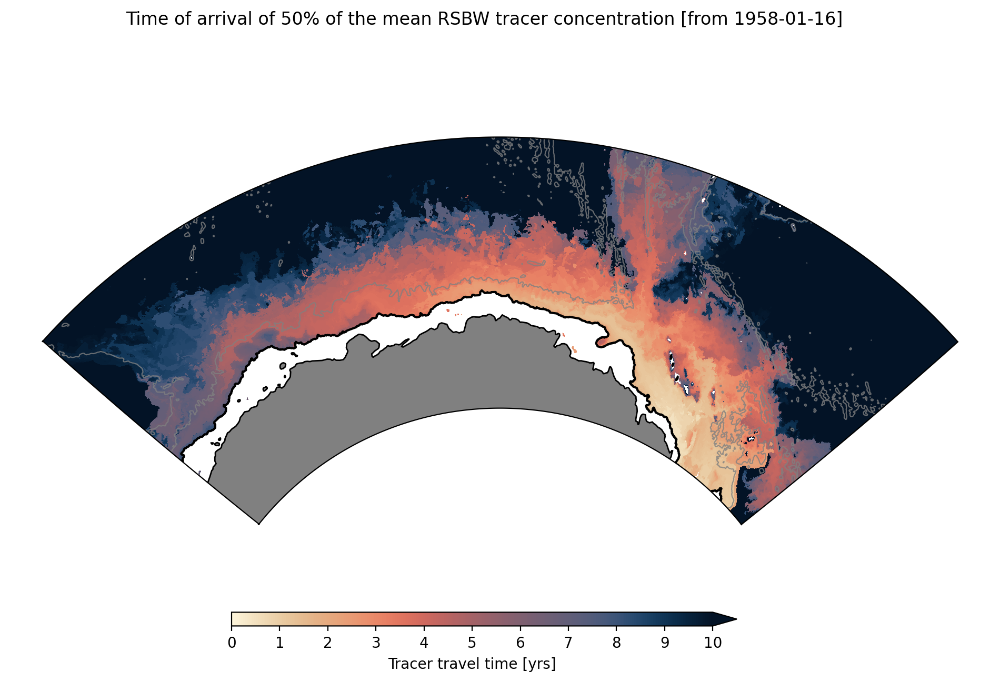

In [187]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, rsbw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max',ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 50% of the mean RSBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/rsbw_timing_map_50%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


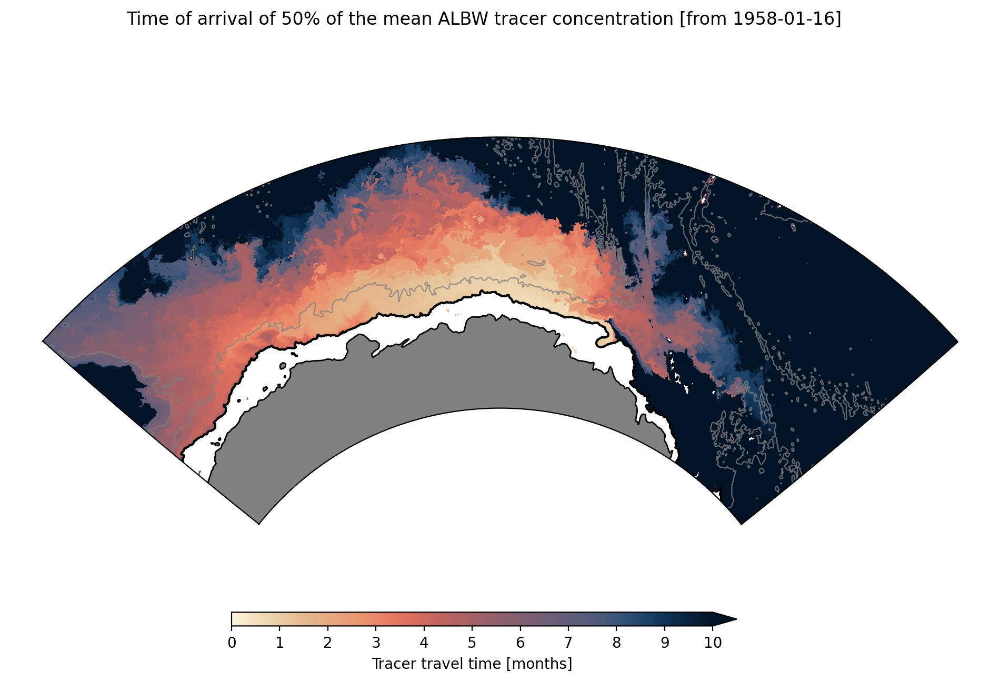

In [188]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [months]')

plt.suptitle('Time of arrival of 50% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_50%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


## Threshold: 80%

In [189]:
condition = rsbw_masked >= (rsbw_mean * 0.80)
rsbw_threshold_80 = rsbw_masked.where(condition) #, drop=True)

condition = albw_masked >= (albw_mean * 0.80)
albw_threshold_80 = albw_masked.where(condition) #, drop=True)

In [190]:
rsbw_time_indices_80 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    rsbw_threshold_80,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
rsbw_timing_80 = rsbw_masked.isel(time=rsbw_time_indices_80).time.dt.date



albw_time_indices_80 = xr.apply_ufunc(
    lambda arr: np.apply_along_axis(
        lambda x: np.where(~np.isnan(x))[0][0] if np.any(~np.isnan(x)) else -1, axis=0, arr=arr
    ),
    albw_threshold_80,
    input_core_dims=[["time"]],
    vectorize=True,
    dask="parallelized",  # Optional for large data
    output_dtypes=[int],
)
albw_timing_80 = albw_masked.isel(time=albw_time_indices_80).time.dt.date


In [191]:
start_time = datetime.date(1958, 1, 16)
rsbw_timedelta = ((rsbw_timing_80 - start_time).dt.days / 365) # in years
albw_timedelta = ((albw_timing_80 - start_time).dt.days / 365) # in years

rsbw_timedelta_mon = ((rsbw_timing_80 - start_time).dt.days/30) # in months
albw_timedelta_mon = ((albw_timing_80 - start_time).dt.days/30) # in months

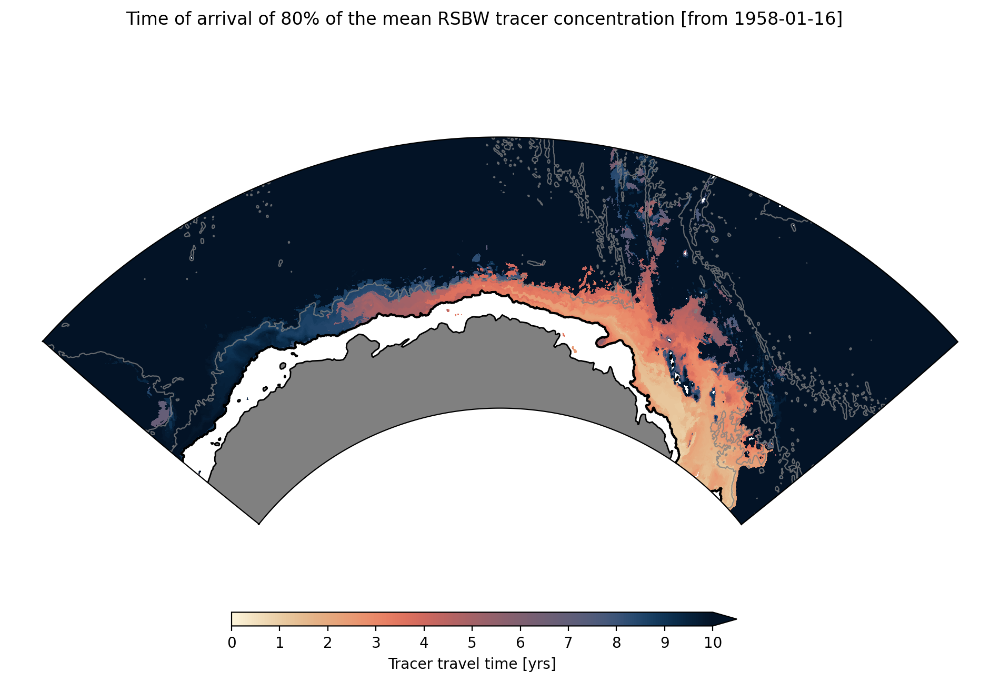

In [192]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, rsbw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 80% of the mean RSBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/rsbw_timing_map_80%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


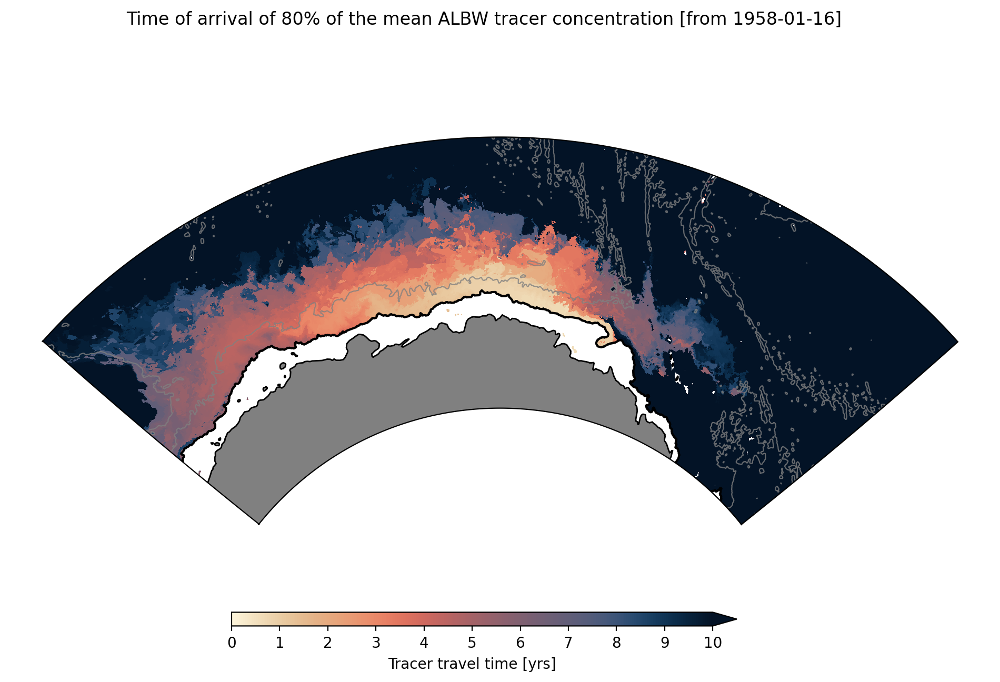

In [193]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())

norm = mcolors.TwoSlopeNorm(vmin=0, vcenter=60, vmax=120)
cmap = cmcrameri.cm.lipari_r
pc = plt.pcolormesh(ht.xt_ocean+360, ht.yt_ocean, albw_timedelta_mon*shelf_mask, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])  # [left, bottom, width, height]
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', extend='max', ticks=[0, 12, 24, 36, 48, 60, 72, 84, 96, 108, 120])
cbar.set_ticklabels(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10'])
cbar.set_label(f'Tracer travel time [yrs]')

plt.suptitle('Time of arrival of 80% of the mean ALBW tracer concentration [from 1958-01-16]')

plt.savefig(f'{figdir}/albw_timing_map_80%_{first_year}-{last_year}.png', dpi=250, bbox_inches='tight')


Load transects locations

In [32]:
with open('/g/data/x77/ps7863/data/ALBW_transport_transects.pkl', 'rb') as file:
    adelie_transects = pickle.load(file)

with open('/g/data/x77/ps7863/data/RSBW_transport_transects.pkl', 'rb') as file:
    ross_transects = pickle.load(file)

In [33]:
transect_1_lons, transect_1_lats = ross_transects['transect_1']['lons'], ross_transects['transect_1']['lats']

In [34]:
lons = lambda transect_1_lons: [x - 360 for x in transect_1_lons]
lons = lons(transect_1_lons)
lats = transect_1_lats
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_1 = yt_ocean.sel(yt_ocean = slice(lats[0],lats[1])).values
# calculate slope and intercept of transect line:
slope = (lons[1] - lons[0])/(lats[1]-lats[0])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_1 = slope * lat_transect_1 + intercept
lon_transect_1 = xr.DataArray(lon_transect_1, dims = 'xt_ocean')
# convert to xarray:
lat_transect_1 = xr.DataArray(lat_transect_1, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_1 = ht.sel(xt_ocean = lon_transect_1, yt_ocean = lat_transect_1, method = 'nearest')


In [35]:
transect_1_lon = ht_transect_1.xt_ocean.values
transect_1_lat = ht_transect_1.yt_ocean.values

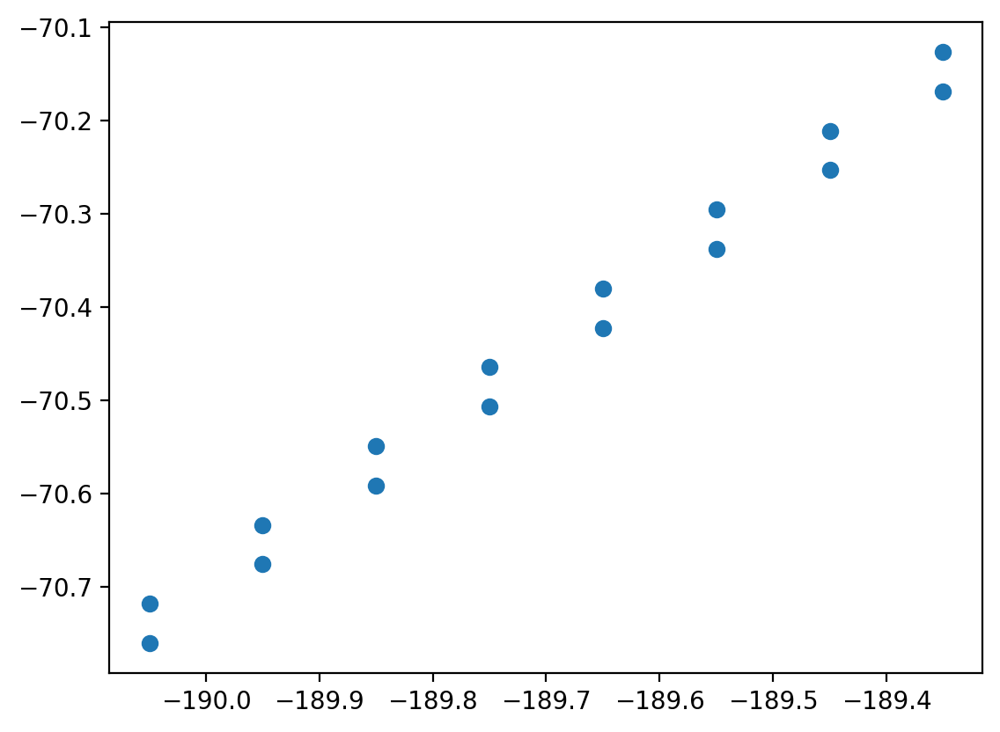

In [36]:
plt.scatter(transect_1_lon, transect_1_lat)

In [37]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_1_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_1_lat]

In [38]:
ross_transect_1 = rsbw_masked.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_transect_1 = ross_transect_1.mean(dim={'xt_ocean','yt_ocean'})

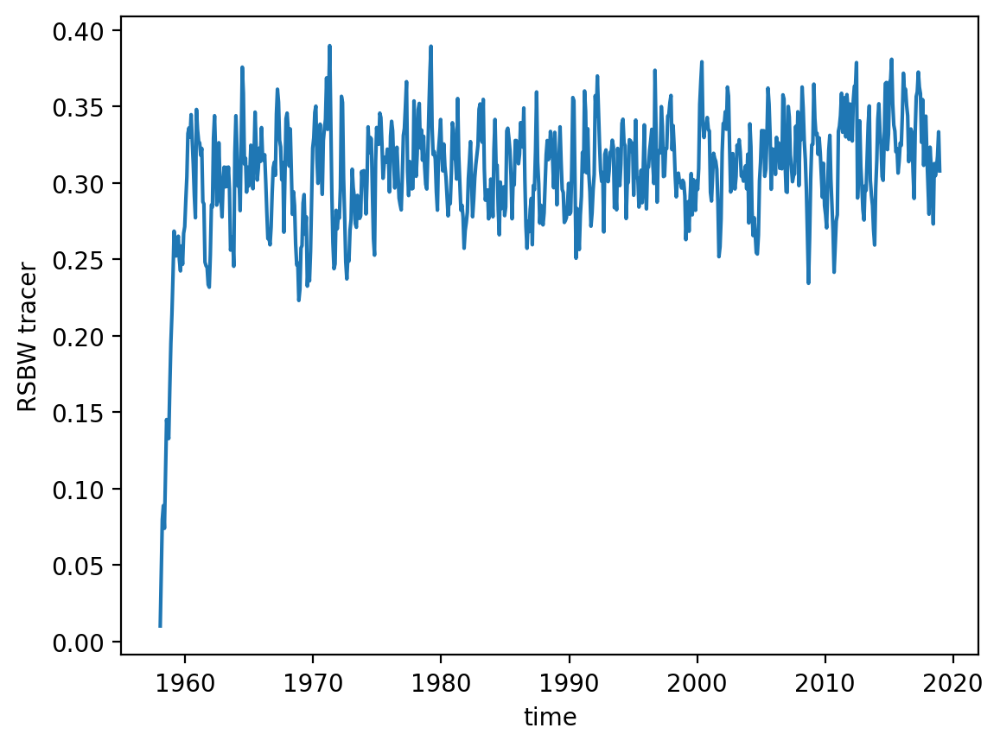

In [39]:
ross_transect_1.plot()

Calculate the mean value at the transect

In [40]:
ross_transect_1_mean = helper.annual_mean_from_monthly(ross_transect_1)
ross_transect_1_mean.values

array(0.30632442)

Find when the concentration hits threshold value of the mean value

In [41]:
threshold = 0.15

In [42]:
condition = (ross_transect_1 >= ross_transect_1_mean*threshold).compute()
indices=ross_transect_1.where(condition, drop=True)

In [43]:
transect_1_time = indices[0].time.dt.date
transect_1_time

<xarray.DataArray 'date' ()> Size: 8B
array(datetime.date(1958, 3, 16), dtype=object)
Coordinates:
    time     datetime64[ns] 8B 1958-03-16T12:00:00
Attributes:
    long_name:       time
    calendar_type:   GREGORIAN
    bounds:          time_bounds
    cartesian_axis:  T

In [29]:
transect_2_lons = [169, 170]
transect_2_lats = [-69.3, -69.6]
lons = lambda transect_2_lons: [x - 360 for x in transect_2_lons]
lons = lons(transect_2_lons)
lats = transect_2_lats
lats_sorted = np.sort(lats)
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_2 = yt_ocean.sel(yt_ocean = slice(lats_sorted[0],lats_sorted[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_2 = slope * lat_transect_2 + intercept
lon_transect_2 = xr.DataArray(lon_transect_2, dims = 'xt_ocean')
# convert to xarray:
lat_transect_2 = xr.DataArray(lat_transect_2, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_2 = ht.sel(xt_ocean = lon_transect_2, yt_ocean = lat_transect_2, method = 'nearest')


In [30]:
transect_2_lon = ht_transect_2.xt_ocean.values
transect_2_lat = ht_transect_2.yt_ocean.values

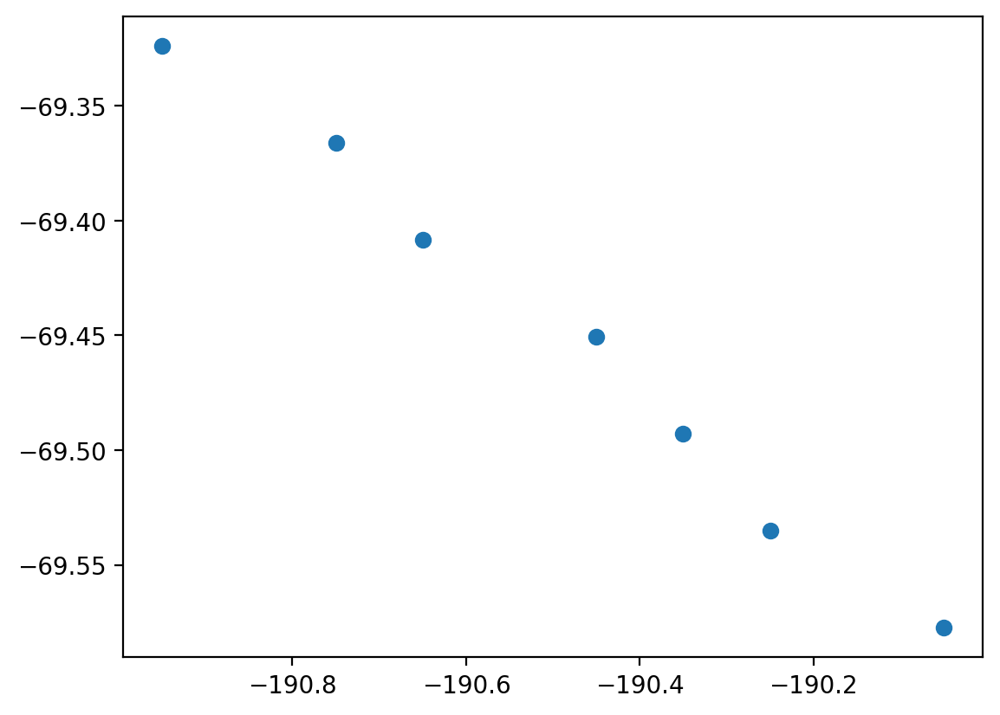

In [35]:
plt.scatter(transect_2_lon,transect_2_lat)

In [31]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_2_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_2_lat]

In [32]:
ross_transect_2 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)


In [33]:
ross_transect_2 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_transect_2 = ross_transect_2.mean(dim={'xt_ocean','yt_ocean'})

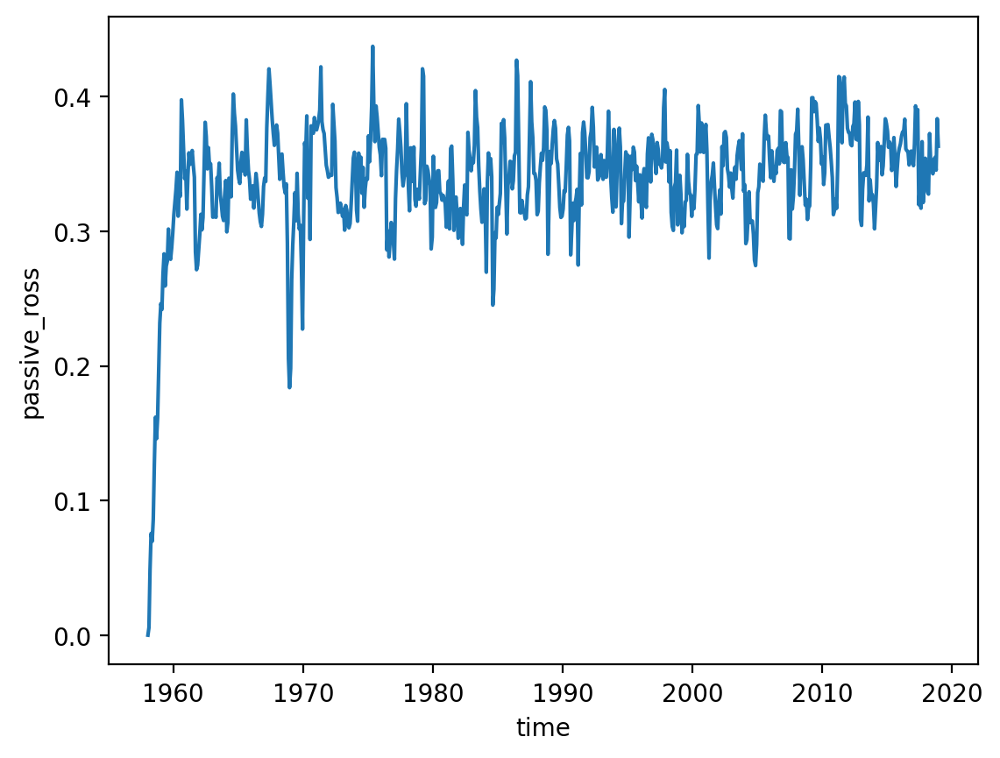

In [45]:
ross_transect_2.plot()

Calculate the mean value at the transect

In [34]:
ross_transect_2_mean = helper.annual_mean_from_monthly(ross_transect_2)
ross_transect_2_mean.values

array(0.33854114)

Find when the concentration hits 80% of the mean value

In [35]:
condition_2 = (ross_transect_2 >= ross_transect_2_mean*threshold).compute()
indices=ross_transect_2.where(condition_2, drop=True)

In [36]:
transect_2_time = indices[0].time.dt.date
transect_2_time

<xarray.DataArray 'date' ()> Size: 8B
array(datetime.date(1958, 4, 16), dtype=object)
Coordinates:
    time     datetime64[ns] 8B 1958-04-16
Attributes:
    long_name:       time
    cartesian_axis:  T
    calendar_type:   GREGORIAN
    bounds:          time_bounds

In [37]:
transect_3_lons = [166, 168]
transect_3_lats = [-69.5, -69.0]
lons = lambda transect_3_lons: [x - 360 for x in transect_3_lons]
lons = lons(transect_3_lons)
lats = transect_3_lats
lats_sorted = np.sort(lats)
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_3 = yt_ocean.sel(yt_ocean = slice(lats_sorted[0],lats_sorted[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_3 = slope * lat_transect_3 + intercept
lon_transect_3 = xr.DataArray(lon_transect_3, dims = 'xt_ocean')
# convert to xarray:
lat_transect_3 = xr.DataArray(lat_transect_3, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_3 = ht.sel(xt_ocean = lon_transect_3, yt_ocean = lat_transect_3, method = 'nearest')


In [38]:
transect_3_lon = ht_transect_3.xt_ocean.values
transect_3_lat = ht_transect_3.yt_ocean.values

In [39]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_3_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_3_lat]

In [40]:
ross_transect_3 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_transect_3 = ross_transect_3.mean(dim={'xt_ocean','yt_ocean'})

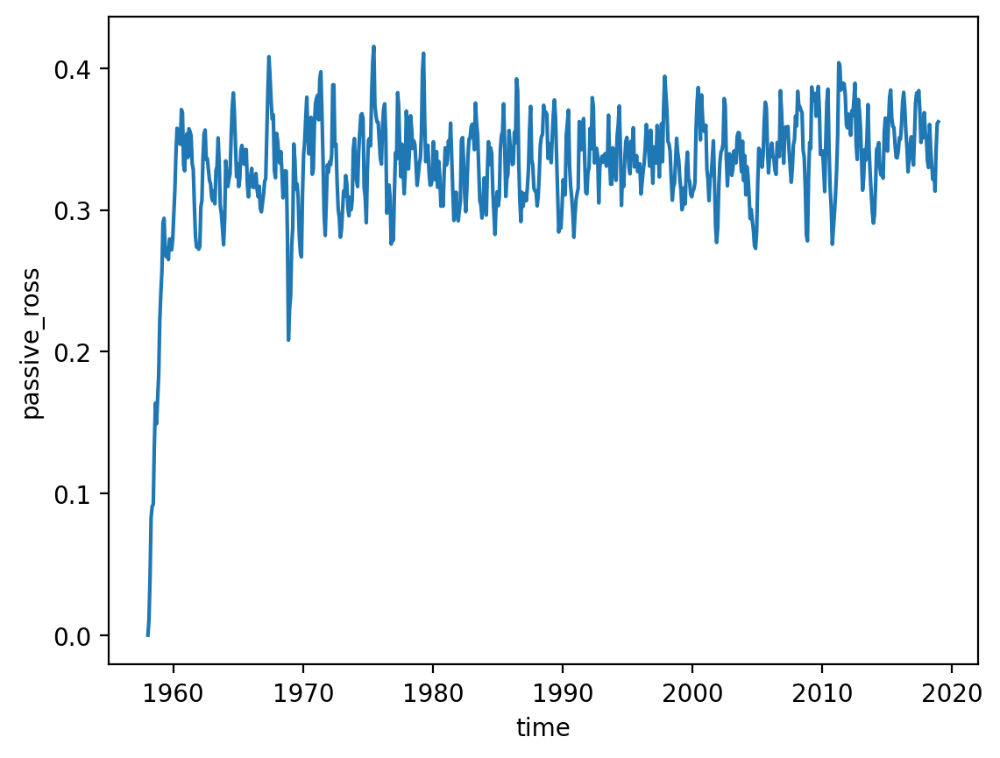

In [56]:
ross_transect_3.plot()

Calculate the mean value at the transect

In [41]:
ross_transect_3_mean = helper.annual_mean_from_monthly(ross_transect_3)
ross_transect_3_mean.values

array(0.33126471)

Find when the concentration hits 80% of the mean value

In [42]:
condition_3 = (ross_transect_3 >= ross_transect_3_mean*threshold).compute()
indices=ross_transect_3.where(condition_3, drop=True)

In [43]:
transect_3_time = indices[0].time.dt.date
transect_3_time

<xarray.DataArray 'date' ()> Size: 8B
array(datetime.date(1958, 4, 16), dtype=object)
Coordinates:
    time     datetime64[ns] 8B 1958-04-16
Attributes:
    long_name:       time
    cartesian_axis:  T
    calendar_type:   GREGORIAN
    bounds:          time_bounds

In [44]:
transect_4_lons = [156, 157.2]
transect_4_lats = [-67, -66.5]
lons = lambda transect_4_lons: [x - 360 for x in transect_4_lons]
lons = lons(transect_4_lons)
lats = transect_4_lats
lats_sorted = np.sort(lats)
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_4 = yt_ocean.sel(yt_ocean = slice(lats_sorted[0],lats_sorted[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_4 = slope * lat_transect_4 + intercept
lon_transect_4 = xr.DataArray(lon_transect_4, dims = 'xt_ocean')
# convert to xarray:
lat_transect_4 = xr.DataArray(lat_transect_4, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_4 = ht.sel(xt_ocean = lon_transect_4, yt_ocean = lat_transect_4, method = 'nearest')


In [45]:
transect_4_lon = ht_transect_4.xt_ocean.values
transect_4_lat = ht_transect_4.yt_ocean.values

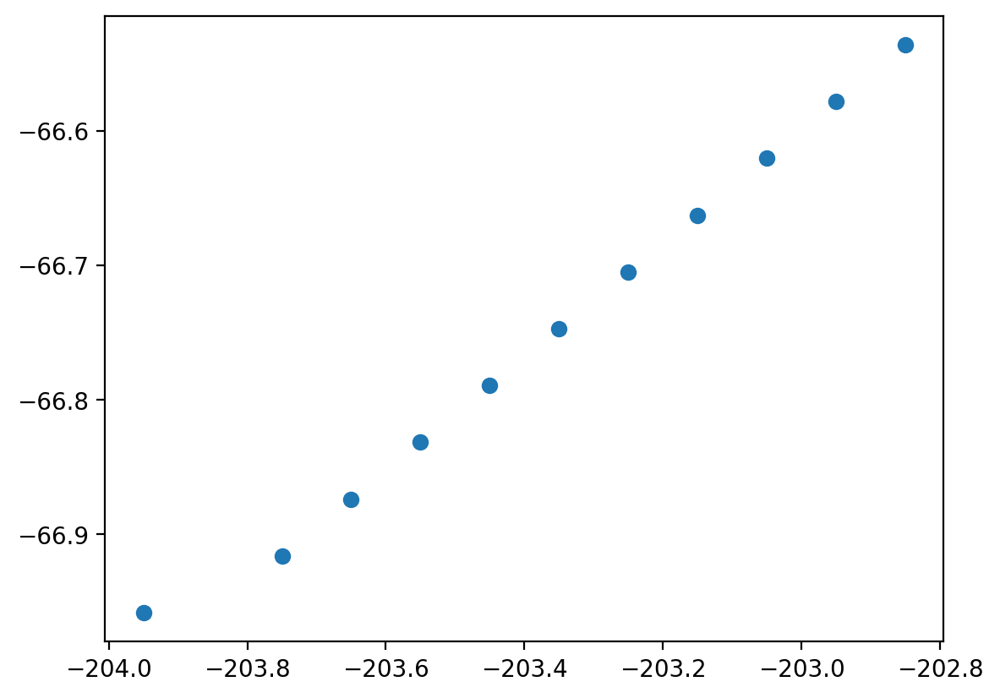

In [63]:
plt.scatter(transect_4_lon,transect_4_lat)

In [46]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_4_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_4_lat]

In [47]:
ross_transect_4 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_transect_4 = ross_transect_4.mean(dim={'xt_ocean','yt_ocean'})

Calculate the mean value at the transect

In [48]:
ross_transect_4_mean = helper.annual_mean_from_monthly(ross_transect_4)
ross_transect_4_mean.values

array(0.26481785)

Find when the concentration hits 80% of the mean value

In [49]:
condition_4 = (ross_transect_4 >= ross_transect_4_mean*threshold).compute()
indices=ross_transect_4.where(condition_4, drop=True)

In [50]:
transect_4_time = indices[0].time.dt.date
transect_4_time

<xarray.DataArray 'date' ()> Size: 8B
array(datetime.date(1958, 9, 16), dtype=object)
Coordinates:
    time     datetime64[ns] 8B 1958-09-16
Attributes:
    long_name:       time
    cartesian_axis:  T
    calendar_type:   GREGORIAN
    bounds:          time_bounds

In [52]:
# start_time = datetime.datetime('')
def calculate_travel_time(transect, threshold): 
    mean_concentration = helper.annual_mean_from_monthly(transect)
    condition = (transect >= mean_concentration*threshold).compute()
    date = transect.where(condition, drop=True)[0].time.dt.date
    return date

In [54]:
calculate_travel_time(ross_transect_4, threshold=0.15)

<xarray.DataArray 'date' ()> Size: 8B
array(datetime.date(1958, 9, 16), dtype=object)
Coordinates:
    time     datetime64[ns] 8B 1958-09-16
Attributes:
    long_name:       time
    cartesian_axis:  T
    calendar_type:   GREGORIAN
    bounds:          time_bounds

In [55]:
transect_6_lons = [151.5, 152.5]
transect_6_lats = [-65.9, -65.1]

In [56]:
# convert x_ocean coordinates to x-360
lons = lambda transect_6_lons: [x - 360 for x in transect_6_lons]
lons = lons(transect_6_lons)
lats = transect_6_lats

yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_6 = yt_ocean.sel(yt_ocean = slice(lats[0],lats[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_6 = slope * lat_transect_6 + intercept
lon_transect_6 = xr.DataArray(lon_transect_6, dims = 'xt_ocean')
# convert to xarray:
lat_transect_6 = xr.DataArray(lat_transect_6, dims = 'yt_ocean')
# Extract ht along transect:
if lon_transect_6[0]==lon_transect_6[-1]:
    lon_transect_6=lon_transect_6[0]
ht_transect_6 = ht.sel(xt_ocean = lon_transect_6, yt_ocean = lat_transect_6, method = 'nearest')

In [57]:
# get xt/yt_ocean values (lon/lats) along the transect
transect_6_lon = ht_transect_6.xt_ocean.values
transect_6_lat = ht_transect_6.yt_ocean.values

In [58]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_6_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_6_lat]

In [60]:
ross_transect_6 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
transect_6_time = calculate_travel_time(ross_transect_6, threshold=0.15)

In [61]:
transect_7_lons = [150.5, 149.5]
transect_7_lats = [-65, -64.5]

In [62]:
lons = lambda transect_7_lons: [x - 360 for x in transect_7_lons]
lons = lons(transect_7_lons)
lats = transect_7_lats
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_7 = yt_ocean.sel(yt_ocean = slice(lats[0],lats[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_7 = slope * lat_transect_7 + intercept
lon_transect_7 = xr.DataArray(lon_transect_7, dims = 'xt_ocean')
# convert to xarray:
lat_transect_7 = xr.DataArray(lat_transect_7, dims = 'yt_ocean')
# Extract ht along transect:
# if lon_transect_7[0]==lon_transect_7[-1]:
#     lon_transect_7=lon_transect_7[0]
ht_transect_7 = ht.sel(xt_ocean = lon_transect_7, yt_ocean = lat_transect_7, method = 'nearest')

In [63]:
transect_7_lon = ht_transect_7.xt_ocean.values
transect_7_lat = ht_transect_7.yt_ocean.values

In [64]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_7_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_7_lat]

In [66]:
ross_transect_7 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
adelie_transect_7 = bottom_adelie.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_7_time = calculate_travel_time(ross_transect_7, threshold=threshold)
adelie_7_time = calculate_travel_time(adelie_transect_7, threshold=threshold)

In [67]:
transect_8_lons = [124.4, 125.4]
transect_8_lats = [-64.6,-65.4]

In [68]:
lons = lambda transect_8_lons: [x - 360 for x in transect_8_lons]
lons = lons(transect_8_lons)
lats = transect_8_lats
lats_sorted = np.sort(lats)
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_8 = yt_ocean.sel(yt_ocean = slice(lats_sorted[0],lats_sorted[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_8 = slope * lat_transect_8 + intercept
lon_transect_8 = xr.DataArray(lon_transect_8, dims = 'xt_ocean')
# convert to xarray:
lat_transect_8 = xr.DataArray(lat_transect_8, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_8 = ht.sel(xt_ocean = lon_transect_8, yt_ocean = lat_transect_8, method = 'nearest')


In [69]:
transect_8_lon = ht_transect_8.xt_ocean.values
transect_8_lat = ht_transect_8.yt_ocean.values

In [70]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_8_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_8_lat]


In [71]:
ross_transect_8 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
adelie_transect_8 = bottom_adelie.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_8_time = calculate_travel_time(ross_transect_8, threshold=threshold)
adelie_8_time = calculate_travel_time(adelie_transect_8, threshold=threshold)

In [72]:
transect_9_lons = [116.2, 118]
transect_9_lats = [-64.5, -64.2]

In [73]:
lons = lambda transect_9_lons: [x - 360 for x in transect_9_lons]
lons = lons(transect_9_lons)
lats = transect_9_lats
lats_sorted = np.sort(lats)
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_9 = yt_ocean.sel(yt_ocean = slice(lats_sorted[0],lats_sorted[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_9 = slope * lat_transect_9 + intercept
lon_transect_9 = xr.DataArray(lon_transect_9, dims = 'xt_ocean')
# convert to xarray:
lat_transect_9 = xr.DataArray(lat_transect_9, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_9 = ht.sel(xt_ocean = lon_transect_9, yt_ocean = lat_transect_9, method = 'nearest')


In [74]:
transect_9_lon = ht_transect_9.xt_ocean.values
transect_9_lat = ht_transect_9.yt_ocean.values

In [75]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_9_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_9_lat]

In [76]:
ross_transect_9 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
adelie_transect_9 = bottom_adelie.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_9_time = calculate_travel_time(ross_transect_9, threshold=threshold)
adelie_9_time = calculate_travel_time(adelie_transect_9, threshold=threshold)


In [77]:
transect_10_lons = [136.3, 137.1]
transect_10_lats = [-63.3, -63.7]
lons = lambda transect_10_lons: [x - 360 for x in transect_10_lons]
lons = lons(transect_10_lons)
lats = transect_10_lats
lats_sorted = np.sort(lats)
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_10 = yt_ocean.sel(yt_ocean = slice(lats_sorted[0],lats_sorted[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_10 = slope * lat_transect_10 + intercept
lon_transect_10 = xr.DataArray(lon_transect_10, dims = 'xt_ocean')
# convert to xarray:
lat_transect_10 = xr.DataArray(lat_transect_10, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_10 = ht.sel(xt_ocean = lon_transect_10, yt_ocean = lat_transect_10, method = 'nearest')


In [78]:
transect_10_lon = ht_transect_10.xt_ocean.values
transect_10_lat = ht_transect_10.yt_ocean.values

In [79]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_10_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_10_lat]


In [80]:
ross_transect_10 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
adelie_transect_10 = bottom_adelie.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_10_time = calculate_travel_time(ross_transect_10, threshold=threshold)
adelie_10_time = calculate_travel_time(adelie_transect_10, threshold=threshold)

In [81]:
transect_12_lons = [145, 145.5]
transect_12_lats = [-65.9, -65.1]
lons = lambda transect_12_lons: [x - 360 for x in transect_12_lons]
lons = lons(transect_12_lons)
lats = transect_12_lats
lats_sorted = np.sort(lats)
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_12 = yt_ocean.sel(yt_ocean = slice(lats_sorted[0],lats_sorted[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_12 = slope * lat_transect_12 + intercept
lon_transect_12 = xr.DataArray(lon_transect_12, dims = 'xt_ocean')
# convert to xarray:
lat_transect_12 = xr.DataArray(lat_transect_12, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_12 = ht.sel(xt_ocean = lon_transect_12, yt_ocean = lat_transect_12, method = 'nearest')


In [82]:
transect_12_lon = ht_transect_12.xt_ocean.values
transect_12_lat = ht_transect_12.yt_ocean.values

In [83]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_12_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_12_lat]

In [84]:
ross_transect_12 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
adelie_transect_12 = bottom_adelie.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_12_time = calculate_travel_time(ross_transect_12, threshold=threshold)
adelie_12_time = calculate_travel_time(adelie_transect_12, threshold=threshold)

In [85]:
transect_14_lons = [160, 163]
transect_14_lats = [-68.5, -67.5]
transect_lons = transect_14_lons
transect_lats = transect_14_lats
lons = lambda transect_lons: [x - 360 for x in transect_lons]
lons = lons(transect_lons)
lats = transect_lats
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_14 = yt_ocean.sel(yt_ocean = slice(lats[0],lats[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_14 = slope * lat_transect_14 + intercept
lon_transect_14 = xr.DataArray(lon_transect_14, dims = 'xt_ocean')
# convert to xarray:
lat_transect_14 = xr.DataArray(lat_transect_14, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_14 = ht.sel(xt_ocean = lon_transect_14, yt_ocean = lat_transect_14, method = 'nearest')


In [86]:
transect_14_lon = ht_transect_14.xt_ocean.values
transect_14_lat = ht_transect_14.yt_ocean.values

In [87]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_14_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_14_lat]

In [88]:
ross_transect_14 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
transect_14_time = calculate_travel_time(ross_transect_14, threshold=threshold)

In [89]:
transect_15_lons = [137.5, 138.5]
transect_15_lats = [-65.1, -64.4]
transect_lons = transect_15_lons
transect_lats = transect_15_lats
lons = lambda transect_lons: [x - 360 for x in transect_lons]
lons = lons(transect_lons)
lats = transect_lats
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_15 = yt_ocean.sel(yt_ocean = slice(lats[0],lats[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_15 = slope * lat_transect_15 + intercept
lon_transect_15 = xr.DataArray(lon_transect_15, dims = 'xt_ocean')
# convert to xarray:
lat_transect_15 = xr.DataArray(lat_transect_15, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_15 = ht.sel(xt_ocean = lon_transect_15, yt_ocean = lat_transect_15, method = 'nearest')


In [90]:
transect_15_lon = ht_transect_15.xt_ocean.values
transect_15_lat = ht_transect_15.yt_ocean.values

In [91]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_15_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_15_lat]

ross_transect_15 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
adelie_transect_15 = bottom_adelie.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_15_time = calculate_travel_time(ross_transect_15, threshold=threshold)
adelie_15_time = calculate_travel_time(adelie_transect_15, threshold=threshold)

In [92]:
transect_17_lons = [107.2, 107.8]
transect_17_lats = [-64.9, -64.4]
transect_lons = transect_17_lons
transect_lats = transect_17_lats
lons = lambda transect_lons: [x - 360 for x in transect_lons]
lons = lons(transect_lons)
lats = transect_lats
yt_ocean = ht.yt_ocean
# get latitude of points along transect:
lat_transect_17 = yt_ocean.sel(yt_ocean = slice(lats[0],lats[1])).values
# calculate slope and intercept of transect line:
slope = (lons[0] - lons[1])/(lats[0]-lats[1])
intercept = lons[0] - slope * lats[0]
# get longitude along transect and convert to xarray:
lon_transect_17 = slope * lat_transect_17 + intercept
lon_transect_17 = xr.DataArray(lon_transect_17, dims = 'xt_ocean')
# convert to xarray:
lat_transect_17 = xr.DataArray(lat_transect_17, dims = 'yt_ocean')
# Extract ht along transect:
ht_transect_17 = ht.sel(xt_ocean = lon_transect_17, yt_ocean = lat_transect_17, method = 'nearest')


In [93]:
transect_17_lon = ht_transect_17.xt_ocean.values
transect_17_lat = ht_transect_17.yt_ocean.values

In [95]:
indices_lon = [np.where(ht.xt_ocean.values == lon)[0][0] for lon in transect_17_lon]
indices_lat = [np.where(ht.yt_ocean.values == lat)[0][0] for lat in transect_17_lat]

ross_transect_17 = bottom_ross.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
adelie_transect_17 = bottom_adelie.isel(xt_ocean=indices_lon, yt_ocean=indices_lat)
ross_17_time = calculate_travel_time(ross_transect_17, threshold=threshold)
adelie_17_time = calculate_travel_time(adelie_transect_17, threshold=threshold)


In [97]:
start_time = datetime.date(1958, 1, 1)
difference_1 = ((transect_1_time.time.dt.date - start_time).dt.days/30).item()
difference_2 = ((transect_2_time.time.dt.date - start_time).dt.days/30).item()
difference_3 = ((transect_3_time.time.dt.date - start_time).dt.days/30).item()
difference_4 = ((transect_4_time.time.dt.date - start_time).dt.days/30).item()
difference_6 = ((transect_6_time.time.dt.date - start_time).dt.days/30).item()
difference_7 = ((ross_7_time.time.dt.date - start_time).dt.days/30).item()
difference_8 = ((ross_8_time.time.dt.date - start_time).dt.days/30).item()
difference_9 = ((ross_9_time.time.dt.date - start_time).dt.days/30).item()
difference_10 = ((ross_10_time.time.dt.date - start_time).dt.days/30).item()
difference_12 = ((ross_12_time.time.dt.date - start_time).dt.days/30).item()
difference_14 = ((transect_14_time.time.dt.date - start_time).dt.days/30).item()
difference_15 = ((ross_15_time.time.dt.date - start_time).dt.days/30).item()
difference_17 = ((ross_17_time.time.dt.date - start_time).dt.days/30).item()

# datetime.timedelta(difference_17)

In [98]:
difference_7_adelie = ((adelie_7_time.time.dt.date - start_time).dt.days/30).item()
difference_8_adelie = ((adelie_8_time.time.dt.date - start_time).dt.days/30).item()
difference_9_adelie = ((adelie_9_time.time.dt.date - start_time).dt.days/30).item()
difference_10_adelie = ((adelie_10_time.time.dt.date - start_time).dt.days/30).item()
difference_12_adelie = ((adelie_12_time.time.dt.date - start_time).dt.days/30).item()
difference_15_adelie = ((adelie_15_time.time.dt.date - start_time).dt.days/30).item()
difference_17_adelie = ((adelie_17_time.time.dt.date - start_time).dt.days/30).item()


In [99]:
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


import cartopy.crs as ccrs
import cartopy.feature as cfeature

In [100]:
land_50m = cfeature.NaturalEarthFeature(
    "physical", "land", "50m", edgecolor="black", facecolor="grey", linewidth=0.5
)

In [101]:
xt_ocean = ht.xt_ocean
yt_ocean = ht.yt_ocean

In [102]:
X, Y = np.meshgrid(xt_ocean, yt_ocean)
X = xr.DataArray(X, coords=[yt_ocean, xt_ocean], dims=['yt_ocean', 'xt_ocean'])
Y = xr.DataArray(Y, coords=[yt_ocean, xt_ocean], dims=['yt_ocean', 'xt_ocean'])

In [103]:
def make_boundary_path(longitudes, latitudes):
    """
    Return a path around boundary to create a sector map, then cut it out given
    longitudes and latitudes.
    """

    boundary_path = np.array([longitudes[-1, :], latitudes[-1, :]])
    boundary_path = np.append(
        boundary_path, np.array([longitudes[::-1, -1], latitudes[::-1, -1]]), axis=1
    )
    boundary_path = np.append(
        boundary_path, np.array([longitudes[1, ::-1], latitudes[1, ::-1]]), axis=1
    )
    boundary_path = np.append(
        boundary_path, np.array([longitudes[:, 1], latitudes[:, 1]]), axis=1
    )
    boundary_path = mpath.Path(np.swapaxes(boundary_path, 0, 1))

    return boundary_path

In [104]:
import pickle
with open('/g/data/x77/ps7863/data/ALBW_transport_transects.pkl', 'rb') as file:
    adelie_transects = pickle.load(file)

with open('/g/data/x77/ps7863/data/RSBW_transport_transects.pkl', 'rb') as file:
    ross_transects = pickle.load(file)

In [105]:
rsbw_transport = xr.open_dataset('/g/data/x77/ps7863/data/rsbw_mean_transport_1985-1999.nc')
rsbw_transport = rsbw_transport['__xarray_dataarray_variable__']
rsbw_transport_masked = rsbw_transport * shelf_mask 
rsbw_transport_masked = rsbw_transport_masked.load()


In [106]:
AABW_layer_mask = xr.open_dataset('/g/data/x77/ps7863/data/AABW_layer_1985-1999mask.nc')
AABW_layer_mask = AABW_layer_mask['AABW_layer_mask']
AABW_layer_mask

<xarray.DataArray 'AABW_layer_mask' (st_ocean: 75, yt_ocean: 592, xt_ocean: 1100)> Size: 391MB
[48840000 values with dtype=float64]
Coordinates:
  * xt_ocean  (xt_ocean) float64 9kB -279.9 -279.8 -279.7 ... -170.1 -170.0
  * yt_ocean  (yt_ocean) float64 5kB -77.98 -77.94 -77.9 ... -50.09 -50.03
  * st_ocean  (st_ocean) float64 600B 0.5413 1.681 2.94 ... 5.511e+03 5.709e+03

In [107]:
xflux_dir = '/g/data/x77/ps7863/data/ross_tracer_adv_fluxes/tgrid/passive_ross_xflux_mean*.nc'
ross_xflux = xr.open_mfdataset(xflux_dir,  concat_dim='year', combine='nested')
ross_xflux = ross_xflux.to_array().squeeze().sel(xt_ocean=lon_slice, yt_ocean=lat_slice)
rsbw_x_mean = ross_xflux.mean(dim='year')
rho=1035
rsbw_x_mean = rsbw_x_mean/rho/1e6
rsbw_x_mean_masked = rsbw_x_mean*AABW_layer_mask*shelf_mask


In [108]:
rsbw_flux_sign = xr.where(rsbw_x_mean_masked.sum('st_ocean') >= 0, 1, -1)
rsbw_flux_sign.name = 'flux_sign'
rsbw_flux_sign.attrs['description'] = 'Sign of passive tracer zonal flux (-1 for negative, 1 for positive)'

# Print or examine the new DataArray
rsbw_flux_sign = rsbw_flux_sign.load()

In [109]:
rsbw_flux_sign = rsbw_flux_sign * shelf_mask
rsbw_flux_sign

<xarray.DataArray (yt_ocean: 510, xt_ocean: 1100)> Size: 4MB
dask.array<multiply, shape=(510, 1100), dtype=float64, chunksize=(466, 720), chunktype=numpy.ndarray>
Coordinates:
  * yt_ocean  (yt_ocean) float64 4kB -77.98 -77.94 -77.9 ... -55.07 -55.01
  * xt_ocean  (xt_ocean) float64 9kB -279.9 -279.8 -279.7 ... -170.1 -170.0
    variable  <U15 60B 'ross_xflux_mean'

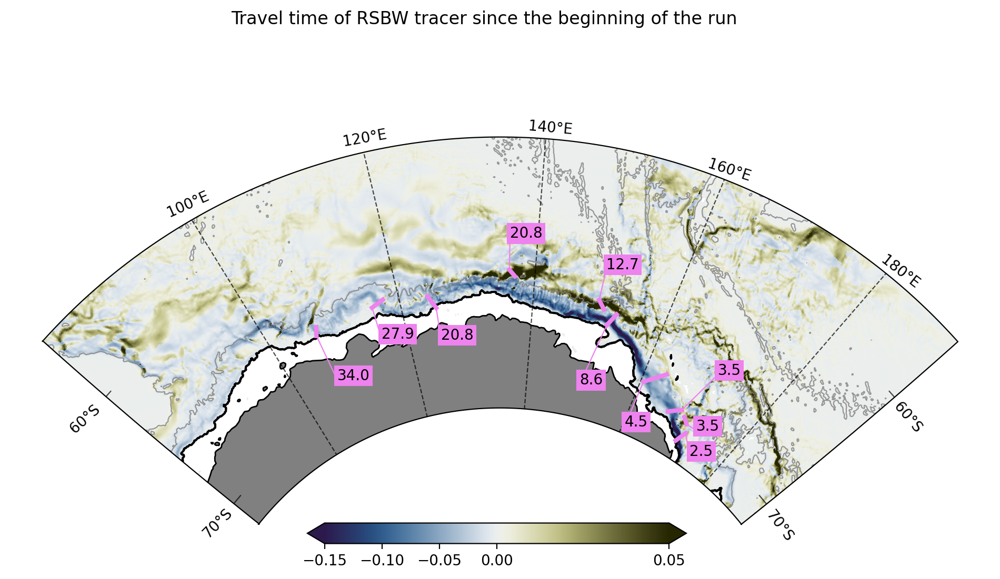

In [110]:
degree =  u'\N{DEGREE SIGN}'
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

# To plot 1000-m contour
contour_file = np.load('/g/data/ik11/grids/Antarctic_slope_contour_1000m.npz')
shelf = contour_file['contour_masked_above']
yt_ocean = contour_file['yt_ocean']
xt_ocean = contour_file['xt_ocean']
# Mask values that are non-zero
shelf[np.where(shelf!=0)] = np.nan
shelf = shelf+1
shelf = np.nan_to_num(shelf)
shelf = xr.DataArray(shelf, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])


ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())



# plot tracer transports
# cmap = 'PRGn'
cmap = cmcrameri.cm.broc
norm = mcolors.TwoSlopeNorm(vmin=-.15, vcenter=0, vmax=.05)
pc = ax.pcolormesh(rsbw_transport_masked.xt_ocean+360,
                    rsbw_transport_masked.yt_ocean,
                rsbw_transport_masked*rsbw_flux_sign,
                cmap=cmap,
                norm=norm,
                transform=ccrs.PlateCarree()) 


ax.plot([100,100], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([120,120], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([140,140], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([160,160], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([180,180], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([80,81], [-60, -60], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([80,82], [-70, -70], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([189,190], [-60, -60], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([188,190], [-70, -70], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())



ax.text(98,-54, s=f'100{degree}E', transform=ccrs.PlateCarree(), rotation=24)
ax.text(118,-54.3, s=f'120{degree}E', transform=ccrs.PlateCarree(), rotation=10)
ax.text(138,-54.8, s=f'140{degree}E', transform=ccrs.PlateCarree(), rotation=-5)
ax.text(158,-55.5, s=f'160{degree}E', transform=ccrs.PlateCarree(), rotation=-18)
ax.text(180,-56, s=f'180{degree}E', transform=ccrs.PlateCarree(), rotation=-38)

ax.text(74,-59.5, s=f'60{degree}S', transform=ccrs.PlateCarree(), rotation=42)
ax.text(72,-69.5, s=f'70{degree}S', transform=ccrs.PlateCarree(), rotation=45)
ax.text(193,-61.5, s=f'60{degree}S', transform=ccrs.PlateCarree(), rotation=-50)
ax.text(195,-71.5, s=f'70{degree}S', transform=ccrs.PlateCarree(), rotation=-53)


colour = 'violet'
line_colour = 'violet'
linewidth = 3
ax.plot(ross_transects['transect_1']['lons'],ross_transects['transect_1']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_2']['lons'],ross_transects['transect_2']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_3']['lons'],ross_transects['transect_3']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
# ax.plot(ross_transects['transect_4']['lons'],ross_transects['transect_4']['lats'], c=line_colour, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_6']['lons'],ross_transects['transect_6']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_7']['lons'],ross_transects['transect_7']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_8']['lons'],ross_transects['transect_8']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_9']['lons'],ross_transects['transect_9']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_10']['lons'],ross_transects['transect_10']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
# ax.plot(ross_transects['transect_12']['lons'], ross_transects['transect_12']['lats'], c=line_colour, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_14']['lons'], ross_transects['transect_14']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
# ax.plot(ross_transects['transect_15']['lons'], ross_transects['transect_15']['lats'], c=line_colour, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_17']['lons'], ross_transects['transect_17']['lats'], c=line_colour, linewidth=linewidth, transform=ccrs.PlateCarree())
# ax.scatter(ross_transects['transect_5']['lons']+360, ross_transects['transect_5']['lats'], s=.3, c=line_colour, transform=ccrs.PlateCarree(), zorder=10)
# ax.scatter(ross_transects['transect_11']['lons']+360, ross_transects['transect_11']['lats'], s=.3, c=line_colour, transform=ccrs.PlateCarree(), zorder=10)

text_size = 'medium'
text_color = 'black'
# transect 1 
line_x, line_y = ross_transects['transect_1']['lons'][1], ross_transects['transect_1']['lats'][1]
text_x = line_x + 3
text_y = line_y - 1
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_1:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 2
line_x, line_y = ross_transects['transect_2']['lons'][1],  ross_transects['transect_2']['lats'][1]
text_x = line_x + 2
text_y = line_y 
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_2:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 3
line_x, line_y = ross_transects['transect_3']['lons'][1],  ross_transects['transect_3']['lats'][1]
text_x = line_x + 2
text_y = line_y + 3
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_3:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# # transect 4
# line_x, line_y = ross_transects['transect_4']['lons'][1],  ross_transects['transect_4']['lats'][1]
# text_x = line_x 
# text_y = line_y + 2
# ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
# ax.text(
#             x=text_x,
#             y=text_y,
#             s=f"{ross_transects['transect_4']['transport']:.2f}Sv",
#             color='white',
#             fontsize=text_size,
#             bbox=dict(facecolor=colour, edgecolor='none', pad=2),
#             transform=ccrs.PlateCarree()
#         )

# # transect 5
# line_x, line_y = ross_transects['transect_5']['lons'][1],  ross_transects['transect_5']['lats'][1]
# text_x = line_x + 3
# text_y = line_y + 2
# ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
# ax.text(
#             x=text_x,
#             y=text_y,
#             s=f"{difference_5}",
#             color=text_color,
#             fontsize=text_size,
#             bbox=dict(facecolor=colour, edgecolor='none', pad=2),
#             transform=ccrs.PlateCarree()
#         )

# transect 6
line_x, line_y = ross_transects['transect_6']['lons'][0],  ross_transects['transect_6']['lats'][0]
text_x = line_x - 2
text_y = line_y - 4
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_6:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 7
line_x, line_y = ross_transects['transect_7']['lons'][1],  ross_transects['transect_7']['lats'][1]
text_x = line_x 
text_y = line_y + 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_7:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )
# transect 8
line_x, line_y = ross_transects['transect_8']['lons'][1],  ross_transects['transect_8']['lats'][1]
text_x = line_x 
text_y = line_y - 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_8:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )
# transect 9
line_x, line_y = ross_transects['transect_9']['lons'][0],  ross_transects['transect_9']['lats'][0]
text_x = line_x 
text_y = line_y - 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_9:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 10
line_x, line_y = ross_transects['transect_10']['lons'][0],  ross_transects['transect_10']['lats'][0]
text_x = line_x 
text_y = line_y + 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_10:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# # transect 11
# line_x, line_y = ross_transects['transect_11']['lons'][0],  ross_transects['transect_11']['lats'][0]
# text_x = line_x 
# text_y = line_y - 2
# ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
# ax.text(
#             x=text_x,
#             y=text_y,
#             s=f"{difference_11}",
#             color=text_color,
#             fontsize=text_size,
#             bbox=dict(facecolor=colour, edgecolor='none', pad=2),
#             transform=ccrs.PlateCarree()
#         )


# transect 14
line_x, line_y = ross_transects['transect_14']['lons'][0],  ross_transects['transect_14']['lats'][0]
text_x = line_x 
text_y = line_y - 3
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_14:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 17
line_x, line_y = ross_transects['transect_17']['lons'][0],  ross_transects['transect_17']['lats'][0]
text_x = line_x 
text_y = line_y - 3
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_17:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )




cbar_ax = fig.add_axes([0.36, 0.2, 0.3, 0.03])  # [left, bottom, width, height]
plt.suptitle('Travel time of RSBW tracer since the beginning of the run')
# Add colorbars
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', spacing='proportional', ticks=[-.25, -.15, -.10, -.05, 0, 0.05, .10], extend='both')
cbar.set_label('', fontsize=12)

figtit = 'RSBW_travel_time'
plt.savefig(figdir+figtit+'.png', dpi=250, bbox_inches='tight')

In [111]:
albw_transport = xr.open_dataset('/g/data/x77/ps7863/data/albw_mean_transport_1985-1999.nc')
albw_transport = albw_transport['__xarray_dataarray_variable__']
albw_transport_masked = albw_transport * shelf_mask 
albw_transport_masked = albw_transport_masked.load()


In [112]:
xflux_dir = '/g/data/x77/ps7863/data/adelie_tracer_adv_fluxes/tgrid/passive_adelie_xflux_mean*.nc'
adelie_xflux = xr.open_mfdataset(xflux_dir,  concat_dim='year', combine='nested')
adelie_xflux = adelie_xflux.to_array().squeeze().sel(xt_ocean=lon_slice, yt_ocean=lat_slice)
albw_x_mean = adelie_xflux.mean(dim='year')
rho=1035
albw_x_mean = albw_x_mean/rho/1e6
albw_x_mean_masked = albw_x_mean*AABW_layer_mask*shelf_mask


In [113]:
albw_flux_sign = xr.where(albw_x_mean_masked.sum('st_ocean') >= 0, 1, -1)
albw_flux_sign.name = 'flux_sign'
albw_flux_sign.attrs['description'] = 'Sign of passive tracer zonal flux (-1 for negative, 1 for positive)'

# Print or examine the new DataArray
albw_flux_sign = albw_flux_sign.load()

In [114]:
albw_flux_sign = albw_flux_sign * shelf_mask

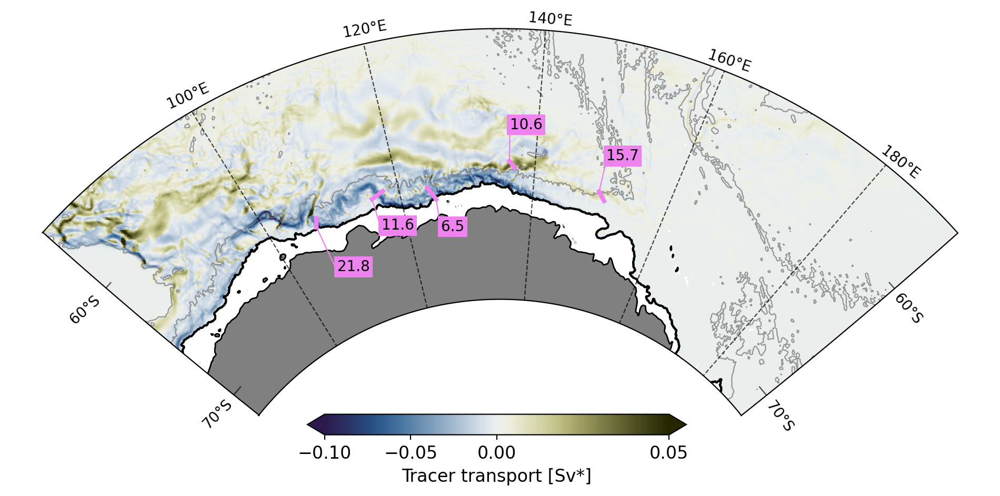

In [115]:
midlon = -225
maxlon = midlon + 60
minlon = midlon - 60
minlat = -72
maxlat = -55
midlat = (minlat + maxlat) / 2

projection = ccrs.Stereographic(central_longitude=midlon, central_latitude=midlat)

fig = plt.figure(figsize=(12, 6.5))
ax = plt.axes(projection=projection)

ax.add_feature(land_50m)
ax.coastlines(resolution="50m")
ax.set_extent([minlon, maxlon, minlat, maxlat], crs=ccrs.PlateCarree())


lons = X.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)
lats = Y.sel(
    {"xt_ocean": slice(minlon, maxlon), "yt_ocean": slice(minlat, maxlat)}
)

boundary_path = make_boundary_path(lons, lats)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())

# To plot 1000-m contour
contour_file = np.load('/g/data/ik11/grids/Antarctic_slope_contour_1000m.npz')
shelf = contour_file['contour_masked_above']
yt_ocean = contour_file['yt_ocean']
xt_ocean = contour_file['xt_ocean']
# Mask values that are non-zero
shelf[np.where(shelf!=0)] = np.nan
shelf = shelf+1
shelf = np.nan_to_num(shelf)
shelf = xr.DataArray(shelf, coords = [('yt_ocean', yt_ocean), ('xt_ocean', xt_ocean)])

ax.contour(shelf.xt_ocean, shelf.yt_ocean,shelf,
                [0.5],
                colors = 'k',
                linewidths = 1.5,
                transform=ccrs.PlateCarree())

ax.contour(ht.xt_ocean, ht.yt_ocean, ht,
                levels=[3500],
                colors='grey',
                linewidths=.8,
                alpha=.8,
                transform=ccrs.PlateCarree())


cmap = cmcrameri.cm.broc
norm = mcolors.TwoSlopeNorm(vmin=-.10, vcenter=0, vmax=.05)
pc = ax.pcolormesh(albw_transport_masked.xt_ocean+360,
                    albw_transport_masked.yt_ocean,
                 albw_transport_masked*albw_flux_sign,
                 cmap=cmap,
                norm=norm,
                transform=ccrs.PlateCarree())

ax.plot([100,100], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([120,120], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([140,140], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([160,160], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([180,180], [-80, -50], linestyle='--', c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([80,81], [-60, -60], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([80,82], [-70, -70], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([189,190], [-60, -60], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())
ax.plot([188,190], [-70, -70], c='k', alpha=0.7, linewidth=0.8, transform=ccrs.PlateCarree())



ax.text(98,-54, s=f'100{degree}E', transform=ccrs.PlateCarree(), rotation=24)
ax.text(118,-54.3, s=f'120{degree}E', transform=ccrs.PlateCarree(), rotation=10)
ax.text(138,-54.8, s=f'140{degree}E', transform=ccrs.PlateCarree(), rotation=-5)
ax.text(158,-55.5, s=f'160{degree}E', transform=ccrs.PlateCarree(), rotation=-18)
ax.text(180,-56, s=f'180{degree}E', transform=ccrs.PlateCarree(), rotation=-38)

ax.text(74,-59.5, s=f'60{degree}S', transform=ccrs.PlateCarree(), rotation=42)
ax.text(72,-69.5, s=f'70{degree}S', transform=ccrs.PlateCarree(), rotation=45)
ax.text(193,-61.5, s=f'60{degree}S', transform=ccrs.PlateCarree(), rotation=-50)
ax.text(195,-71.5, s=f'70{degree}S', transform=ccrs.PlateCarree(), rotation=-53)

colour = 'violet'
linewidth = 3
ax.plot(ross_transects['transect_7']['lons'],ross_transects['transect_7']['lats'], c=colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_8']['lons'],ross_transects['transect_8']['lats'], c=colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_9']['lons'],ross_transects['transect_9']['lats'], c=colour, linewidth=linewidth, transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_10']['lons'],ross_transects['transect_10']['lats'], c=colour, linewidth=linewidth, transform=ccrs.PlateCarree())
# ax.plot(ross_transects['transect_12']['lons'], ross_transects['transect_12']['lats'], c=colour, linewidth=linewidth, transform=ccrs.PlateCarree())
# ax.plot(ross_transects['transect_14']['lons'], ross_transects['transect_14']['lats'], c='red', transform=ccrs.PlateCarree())
# ax.plot(ross_transects['transect_15']['lons'], ross_transects['transect_15']['lats'], c='red', transform=ccrs.PlateCarree())
ax.plot(ross_transects['transect_17']['lons'], ross_transects['transect_17']['lats'], c=colour, linewidth=linewidth, transform=ccrs.PlateCarree())

# ax.scatter(ross_transects['transect_5']['lons']+360, ross_transects['transect_5']['lats'], s=1, c=colour, transform=ccrs.PlateCarree(), zorder=10)
# ax.scatter(ross_transects['transect_11']['lons']+360, ross_transects['transect_11']['lats'], s=1, c=colour, transform=ccrs.PlateCarree(), zorder=10)
# ax.scatter(adelie_transects['transect_16']['lons']+360, adelie_transects['transect_16']['lats'], s=1, c=colour, transform=ccrs.PlateCarree(), zorder=10)


text_size = 'medium'
text_color = 'black'

# # transect 5
# line_x, line_y = ross_transects['transect_5']['lons'][1],  ross_transects['transect_5']['lats'][1]
# text_x = line_x + 3
# text_y = line_y + 2
# ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
# ax.text(
#             x=text_x,
#             y=text_y,
#             s=f"{adelie_transects['transect_5']['transport']:.2f}",
#             color=text_color,
#             fontsize=text_size,
#             bbox=dict(facecolor=colour, edgecolor='none', pad=2),
#             transform=ccrs.PlateCarree()
#         )

# transect 7
line_x, line_y = ross_transects['transect_7']['lons'][1],  ross_transects['transect_7']['lats'][1]
text_x = line_x 
text_y = line_y + 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_7_adelie:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 8
line_x, line_y = ross_transects['transect_8']['lons'][1],  ross_transects['transect_8']['lats'][1]
text_x = line_x 
text_y = line_y - 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_8_adelie:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 9
line_x, line_y = ross_transects['transect_9']['lons'][0],  ross_transects['transect_9']['lats'][0]
text_x = line_x 
text_y = line_y - 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_9_adelie:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# transect 10
line_x, line_y = ross_transects['transect_10']['lons'][0],  ross_transects['transect_10']['lats'][0]
text_x = line_x 
text_y = line_y + 2
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_10_adelie:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

# # transect 11
# line_x, line_y = ross_transects['transect_11']['lons'][0],  ross_transects['transect_11']['lats'][0]
# text_x = line_x 
# text_y = line_y - 2
# ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
# ax.text(
#             x=text_x,
#             y=text_y,
#             s=f"{difference_11_adelie:.1f}",
#             color=text_color,
#             fontsize=text_size,
#             bbox=dict(facecolor=colour, edgecolor='none', pad=2),
#             transform=ccrs.PlateCarree()
#         )

# # transect 16
# line_x, line_y = adelie_transects['transect_16']['lons'][-1],  adelie_transects['transect_16']['lats'][-1]
# text_x = line_x + 2
# text_y = line_y - 3
# ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
# ax.text(
#             x=text_x,
#             y=text_y,
#             s=f"{difference_16_adelie:.1f}",
#             color=text_color,
#             fontsize=text_size,
#             bbox=dict(facecolor=colour, edgecolor='none', pad=2),
#             transform=ccrs.PlateCarree()
#         )

# transect 17
line_x, line_y = ross_transects['transect_17']['lons'][0],  ross_transects['transect_17']['lats'][0]
text_x = line_x 
text_y = line_y - 3
ax.plot([line_x, text_x], [line_y, text_y], color=colour, linewidth=0.8, transform=ccrs.PlateCarree())
ax.text(
            x=text_x,
            y=text_y,
            s=f"{difference_17_adelie:.1f}",
            color=text_color,
            fontsize=text_size,
            bbox=dict(facecolor=colour, edgecolor='none', pad=2),
            transform=ccrs.PlateCarree()
        )

cbar_ax = fig.add_axes([0.36, 0.2, 0.3, 0.03])  # [left, bottom, width, height]

# Add colorbars
cbar = plt.colorbar(pc, cax=cbar_ax, orientation='horizontal', spacing='proportional', ticks=[-.25, -.15, -.10, -.05, 0, 0.05, .10], extend='both')
cbar.set_label('Tracer transport [Sv*]', fontsize=12)
cbar.ax.tick_params(labelsize=12)

figtit = 'ALBW_travel_time'
plt.savefig(figdir+figtit+'.png', dpi=250, bbox_inches='tight')

In [53]:
adelie=xr.open_dataset('/g/data/x77/ps7863/data/AABW_variability/bottom_ALBW_tracer.nc')
adelie=adelie['Bottom ALBW tracer']

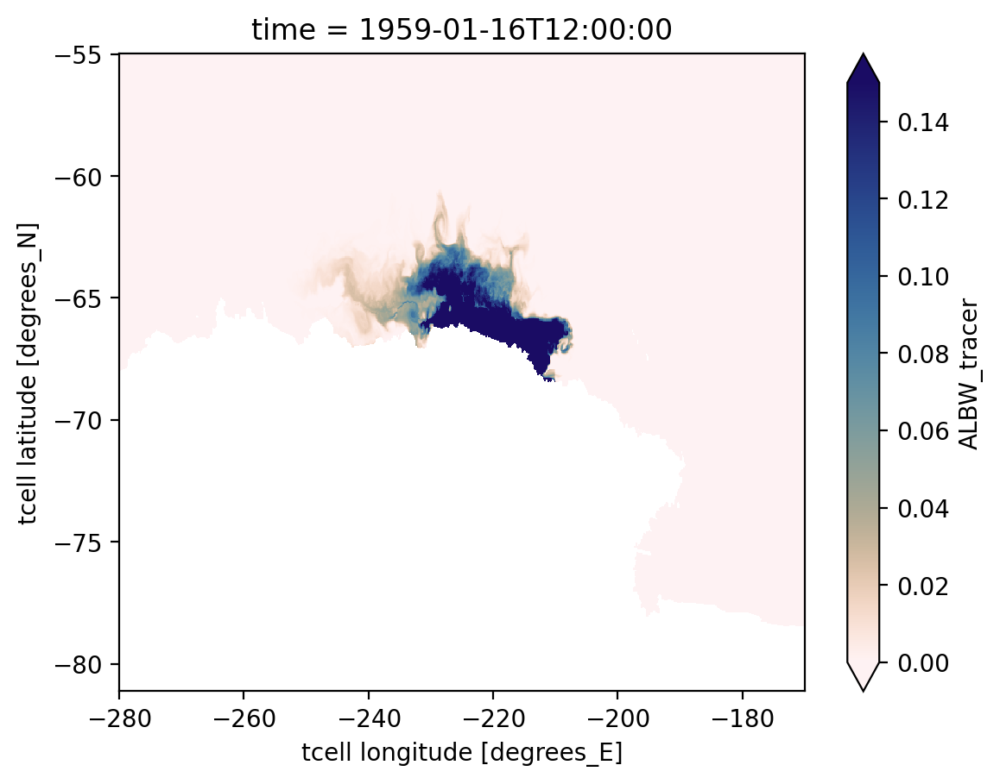

In [74]:
year=1959
month=1
time_slice = slice(f'{year}-{month}-1', f'{year}-{month}-30')
albw.sel(time=time_slice).plot(vmin=0, vmax=0.15,cmap=cmcrameri.cm.lapaz_r)

TypeError: cannot do slice indexing on DatetimeIndex with these indexers [1959-2-30] of type str

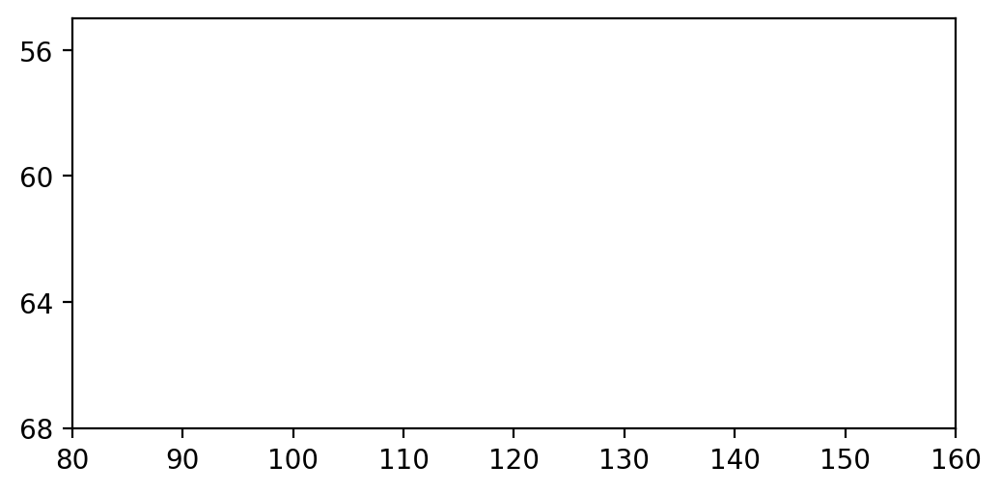

In [68]:
year=1959
month=2
time_slice = slice(f'{year}-{month}-1', f'{year}-{month}-30')

cm=1/2.54
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15*cm, 7*cm))

ax = plt.subplot(111)
ax.set_ylim(-68,-55)
ax.set_xlim(80, 160)
yticks = [-68, -64, -60, -56]
yticklabels = ['68', '64', '60', '56']
ax.set_yticks(yticks)
ax.set_yticklabels(yticklabels)
norm =  mcolors.TwoSlopeNorm(vmin=0, vcenter=.075, vmax=.15)
# cmap = LaPaz_6_r.mpl_colormap
adelie.sel(time=time_slice).plot(vmin=0, vmax=0.15,cmap=cmcrameri.cm.lapaz_r)

# cbar = add_colorbar(ax, pc, extend='max', ticks = [0, .05, .1, .15])
# cbar.ax.set_yticklabels(['0', '5', '10', '15'])
# cbar.set_label('Tracer concentration [%]')

# helper.fix_plot(ax=ax, ht=ht, land_mask=land_mask_masked, shelf_mask=None, axes_labels=True)
